# My First GAN

In [3]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    
    
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Generator


In [4]:

def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
       
        
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        
        nn.ReLU(inplace=True)
    )

In [5]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65
    
# in_features = out_Features is a must 

test_gen_block(25, 25)
test_gen_block(12, 12)


print("Success!")

Success!


In [6]:

# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            
            

            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            
            
           
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [7]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    
    
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"





test_generator(40, 10, 30)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise Vector



In [8]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    tensor = torch.randn( n_samples, z_dim, device = device)
    
    
    
    
    
    return tensor 


In [9]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')


if torch.cuda.is_available():
    
    test_get_noise(1000, 32, 'cuda')

print("Success!")

Success!


## Discriminator



In [10]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2),
        
       
    )

In [11]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [12]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            
            
            nn.Linear(hidden_dim, 1)
           
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [13]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 70)
test_discriminator(90, 89)
print("Success!")

Success!


## Training


In [14]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [15]:

# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
   
    noise_vector = torch.randn(num_images, z_dim, device = device)
    fake_images = gen(noise_vector)
    fake_images = fake_images.detach()
    
    fake_pred = disc(fake_images)
    fake_target = torch.zeros_like(fake_pred, device = device) # ground truth tensor
    fake_loss = criterion(fake_pred, fake_target)
    
    
    real_pred = disc(real)
    real_target = torch.ones_like(real_pred, device = device)
    real_loss = criterion(real_pred, real_target)
    
    disc_loss = (fake_loss + real_loss) / 2
    
   
    return disc_loss

In [18]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [16]:

# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    
    fake_images = torch.randn(num_images, z_dim, device = device)
    
    fake_data = gen(fake_images)
    
    fake_pred = disc(fake_data)

    
    gen_loss = criterion(fake_pred, torch.ones_like(fake_pred))
    
  
    return gen_loss

In [28]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3642453507184988, discriminator loss: 0.4154319429993628


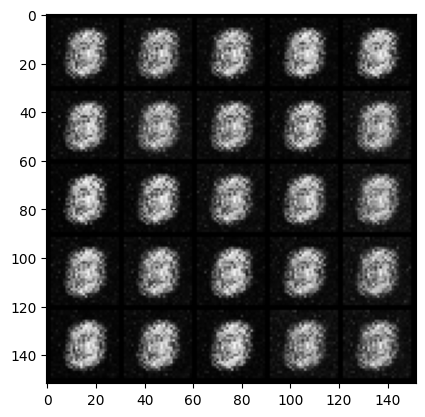

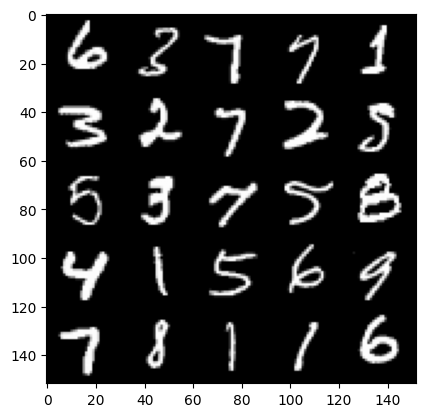

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.712414236545563, discriminator loss: 0.2804632594883442


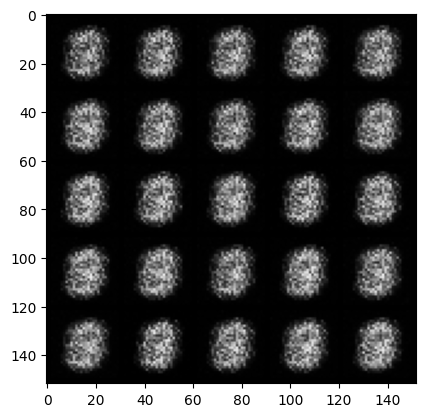

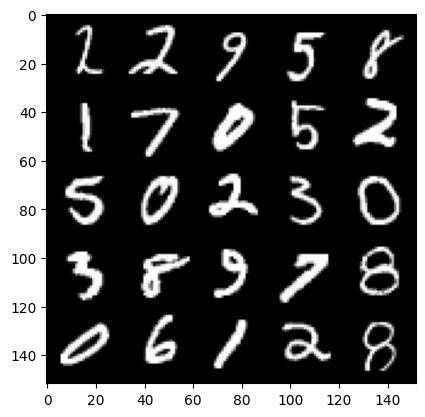

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.967408830881119, discriminator loss: 0.16722452709078808


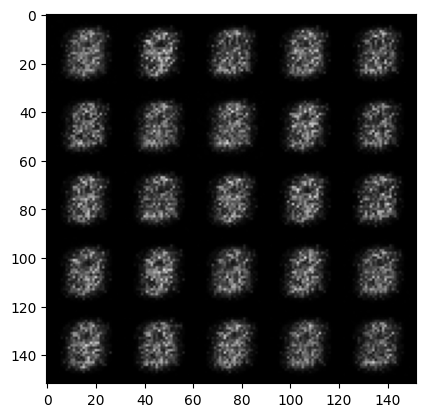

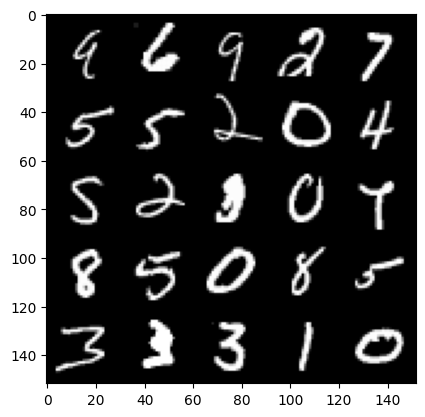

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6994769322872165, discriminator loss: 0.20840213736891758


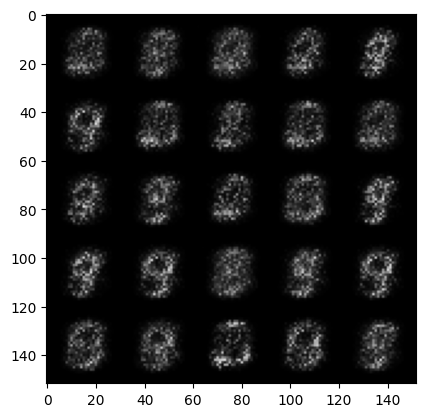

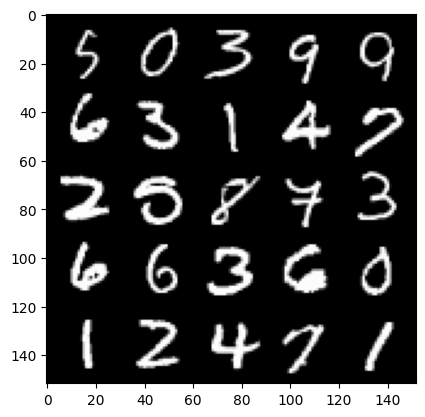

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.680463358640672, discriminator loss: 0.2078290666937827


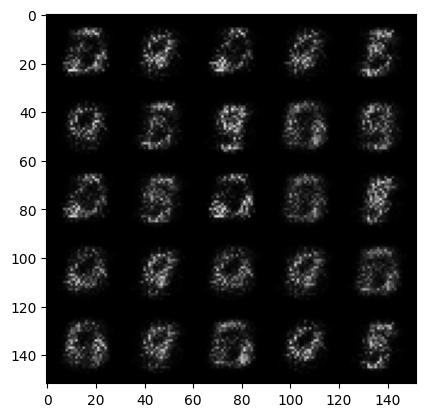

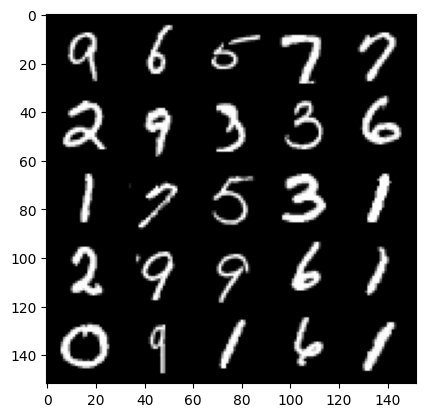

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.9459823372364045, discriminator loss: 0.17397264426946665


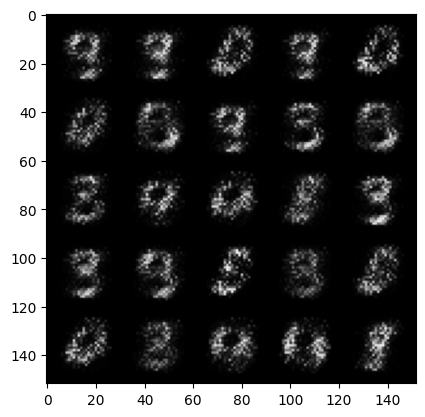

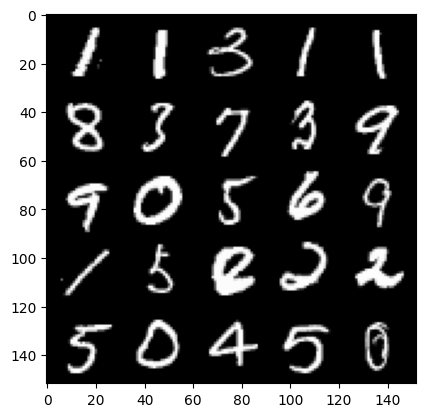

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.4553126475810996, discriminator loss: 0.12544595657289032


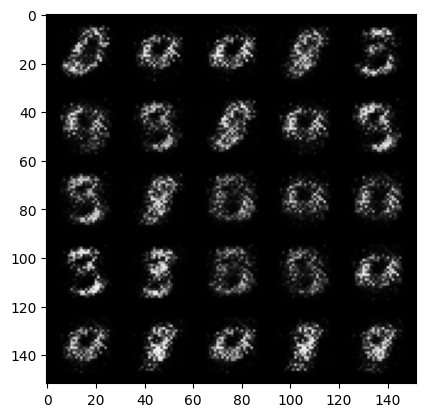

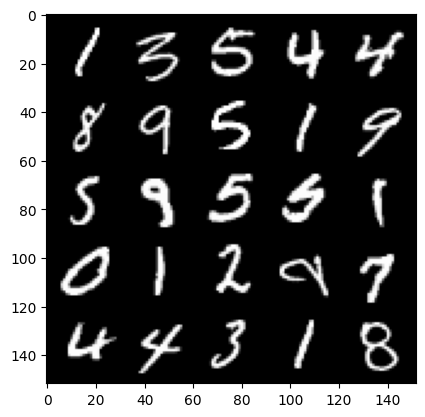

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.924164275646207, discriminator loss: 0.09068356420099734


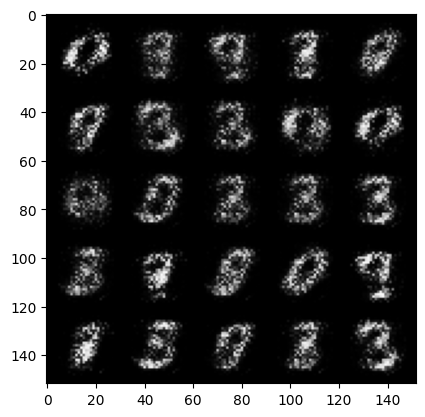

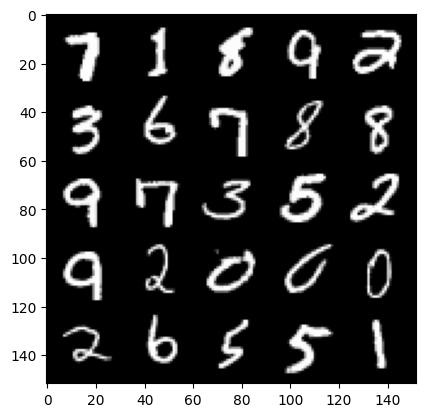

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.281654768943789, discriminator loss: 0.07779627394676207


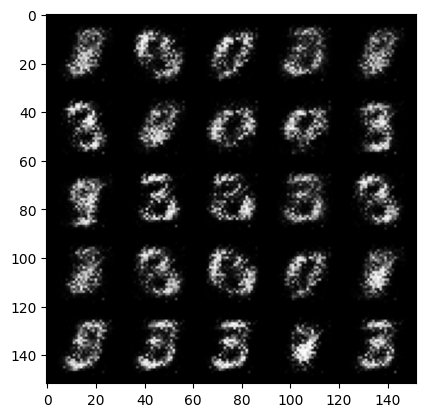

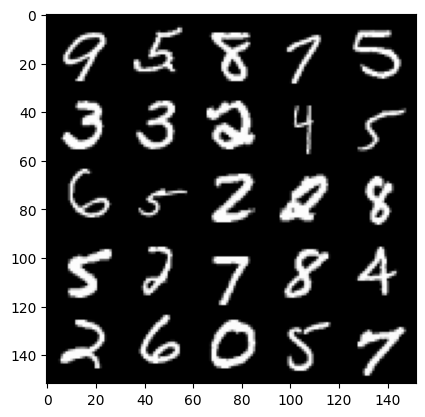

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.5587620792388917, discriminator loss: 0.0683595396727324


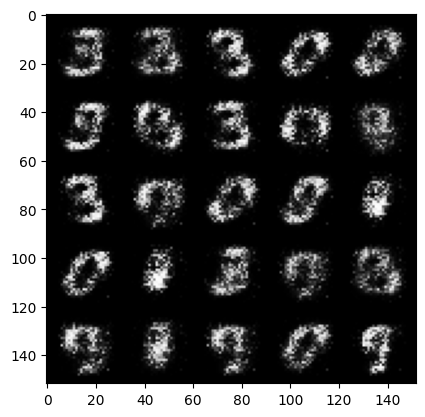

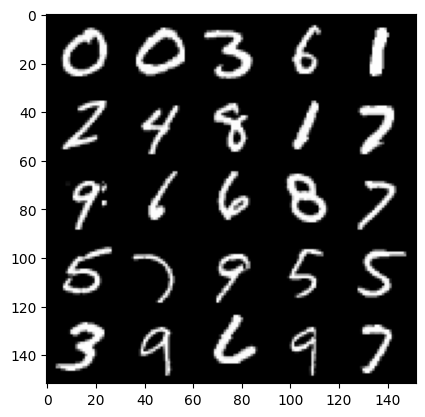

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.685141837596892, discriminator loss: 0.06462586594372986


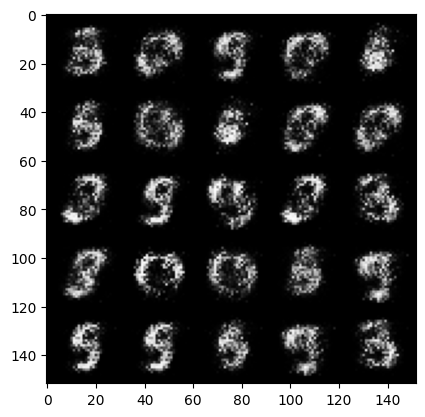

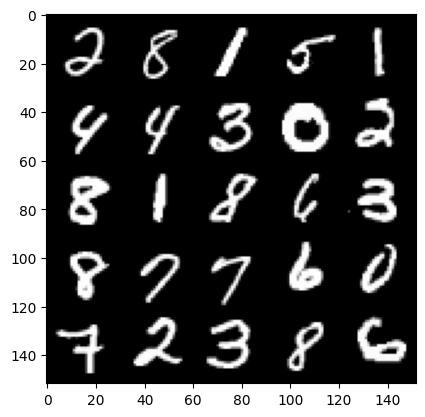

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.8832937746047955, discriminator loss: 0.0660580222159624


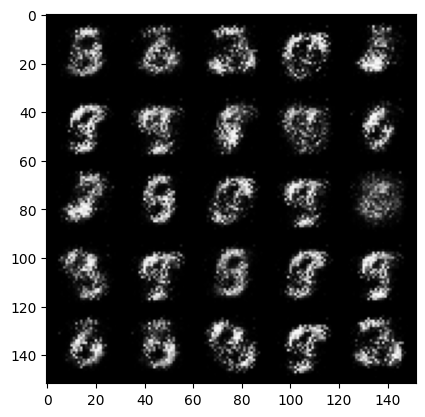

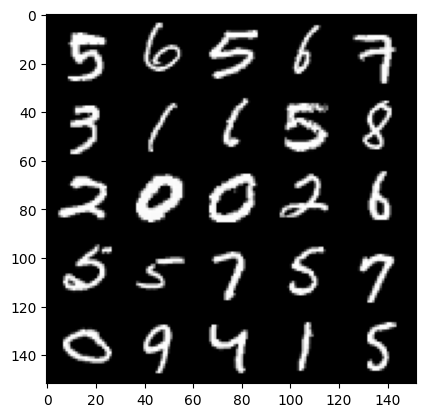

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 4.101878417015074, discriminator loss: 0.05811234129220243


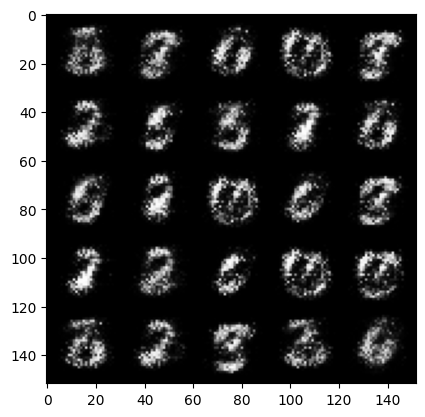

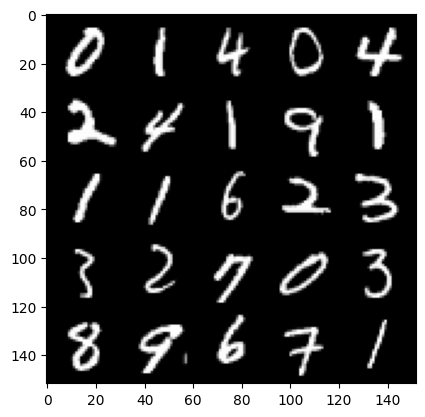

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.012868999481197, discriminator loss: 0.06386089140176772


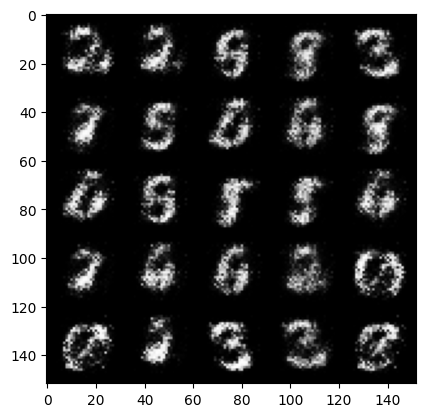

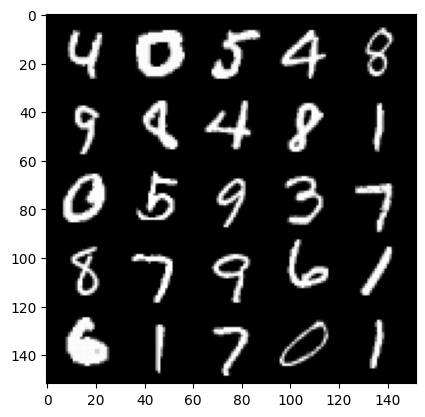

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.250008714199066, discriminator loss: 0.05755249239131804


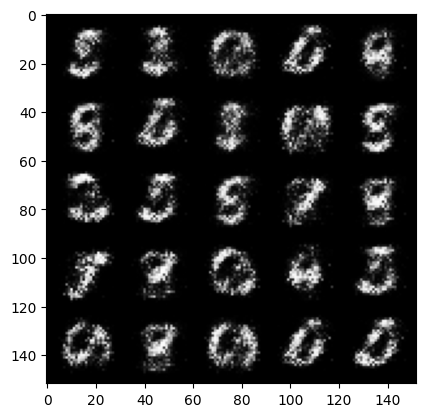

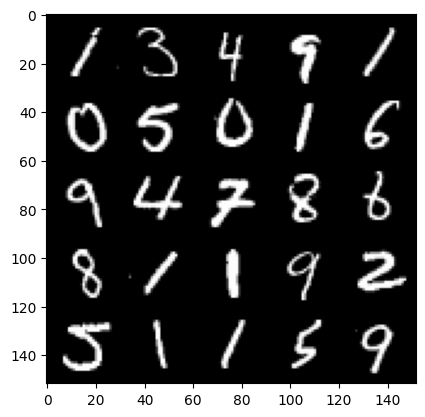

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.252600674152373, discriminator loss: 0.052602442447096054


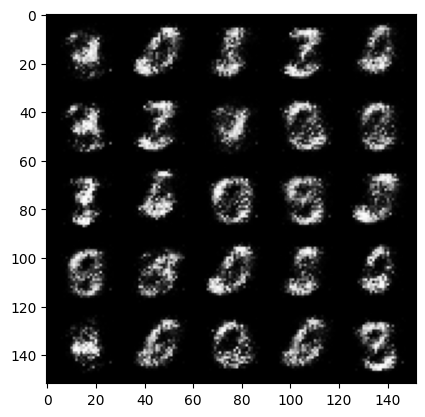

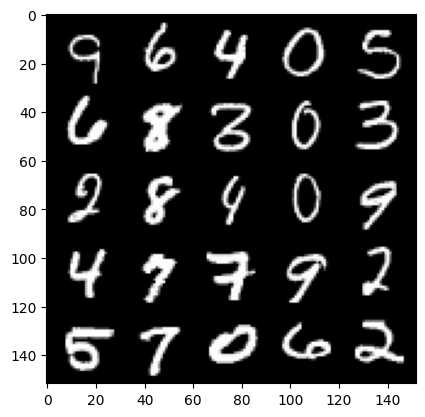

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.099169545173644, discriminator loss: 0.06235137996822597


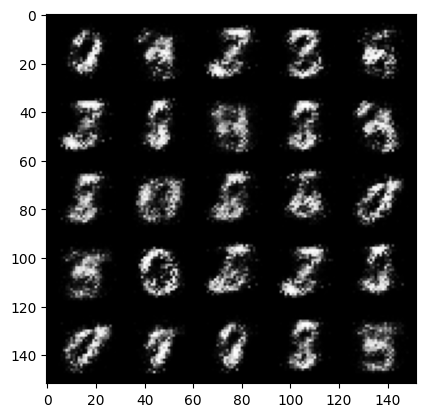

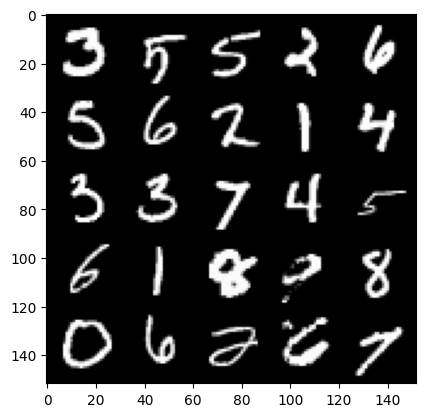

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.398001443862915, discriminator loss: 0.05193163032829759


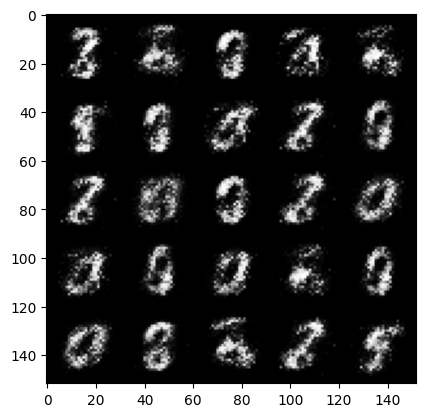

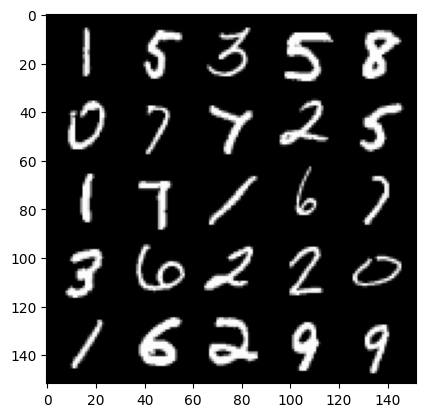

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.307335252285005, discriminator loss: 0.06274570326507091


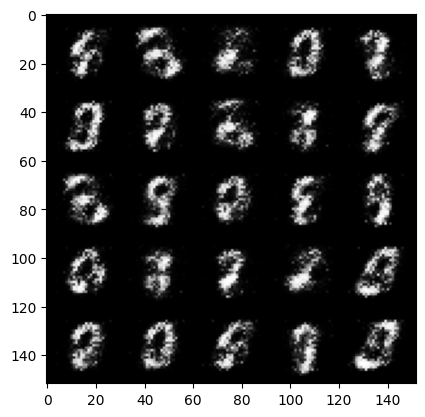

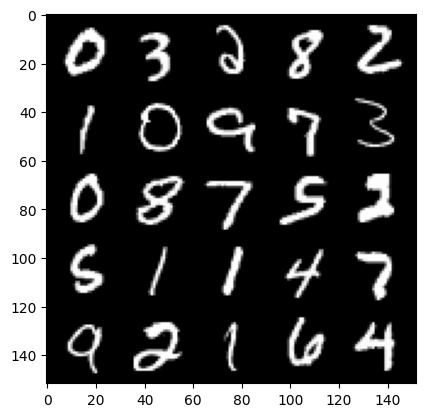

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.076024395465851, discriminator loss: 0.06644698168337342


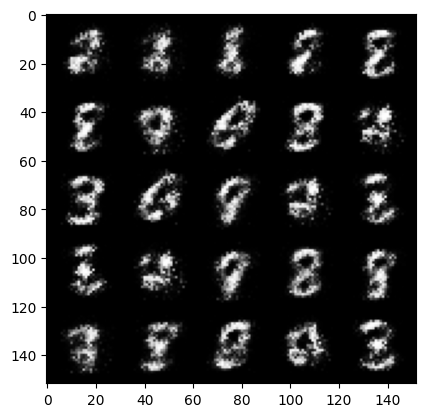

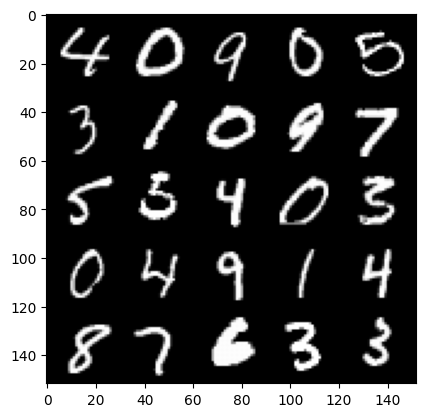

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.231456808090209, discriminator loss: 0.05745673879235982


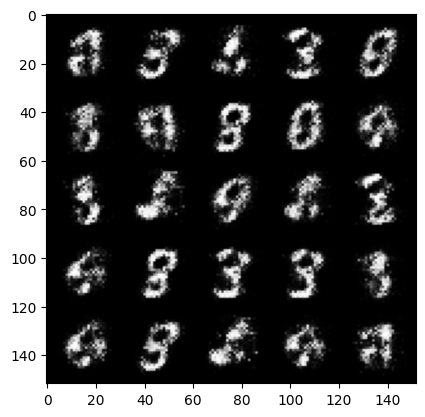

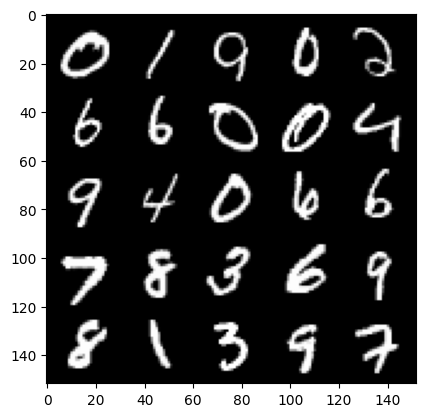

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.1314445486068685, discriminator loss: 0.06698961029574275


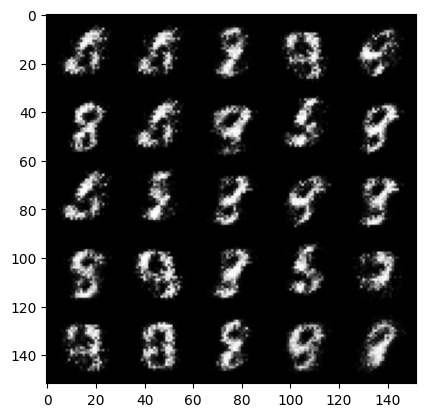

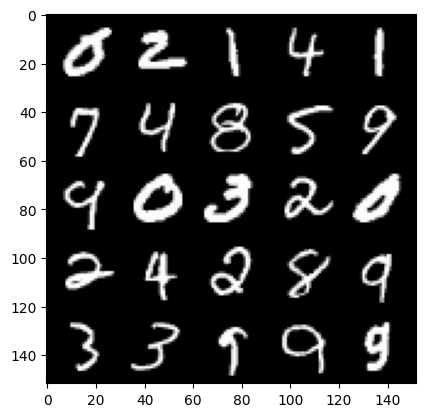

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.8451899971961963, discriminator loss: 0.08005409085750584


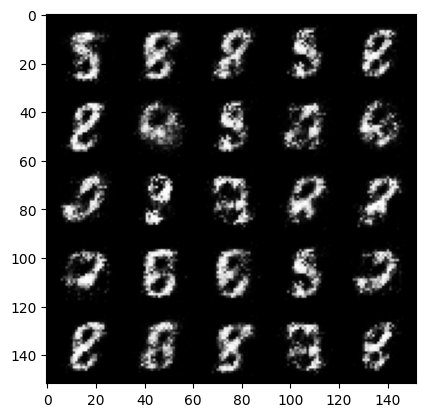

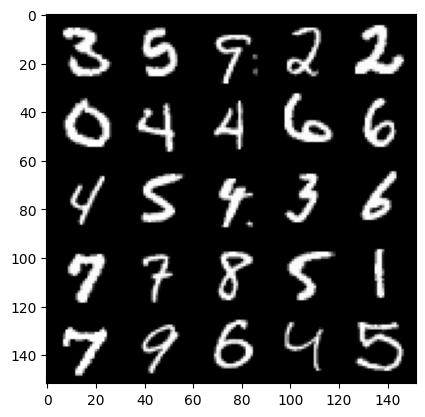

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.234856333255772, discriminator loss: 0.06682949620857837


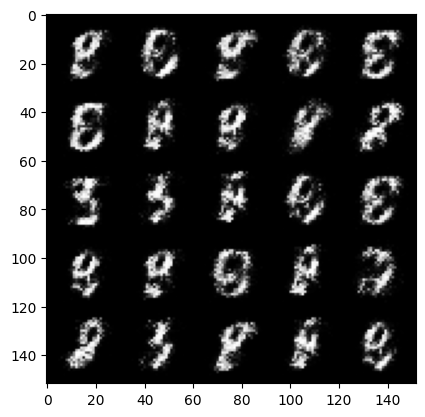

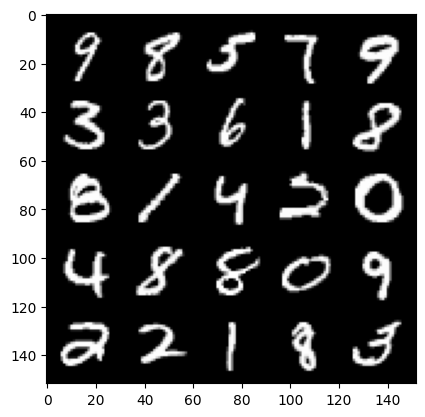

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 4.162820661067963, discriminator loss: 0.07399200439453123


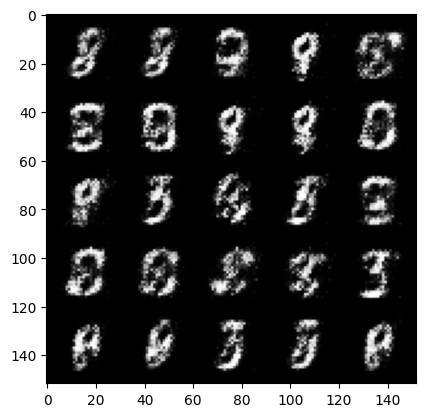

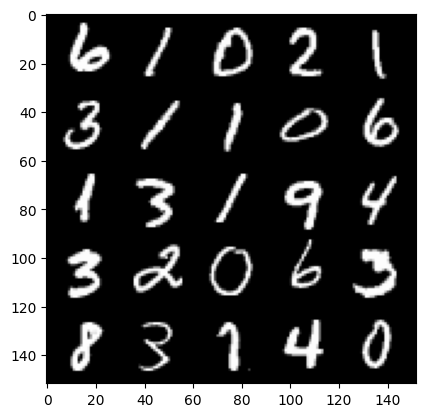

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.242640055656431, discriminator loss: 0.0786937606260181


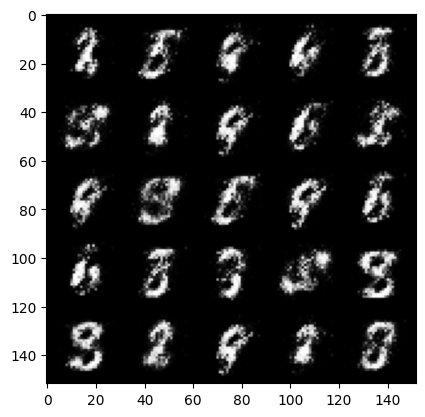

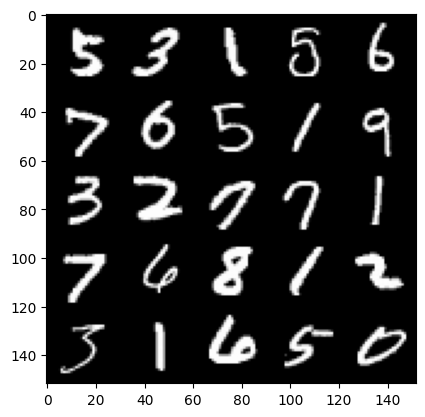

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 4.204850305080414, discriminator loss: 0.0731077676191926


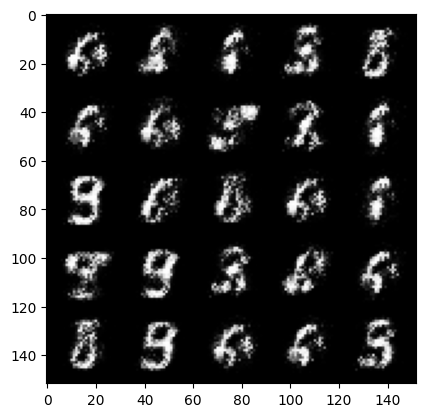

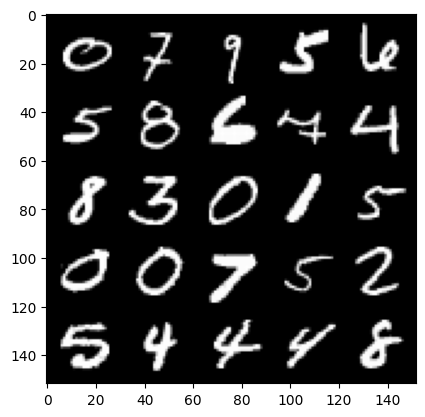

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 4.229032228469845, discriminator loss: 0.0654418977610767


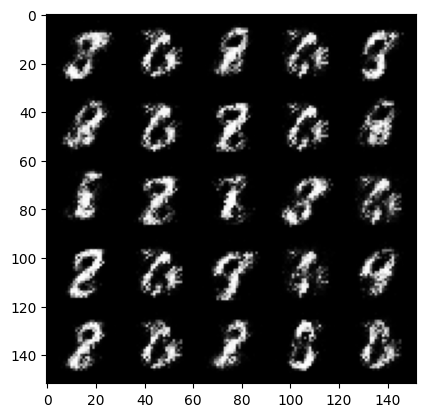

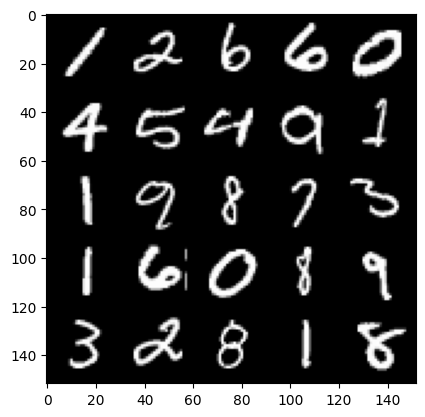

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 4.291601419448849, discriminator loss: 0.07142422354593872


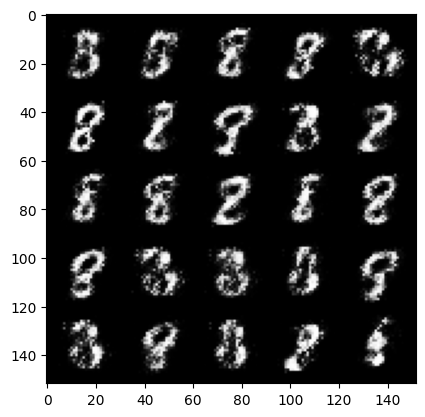

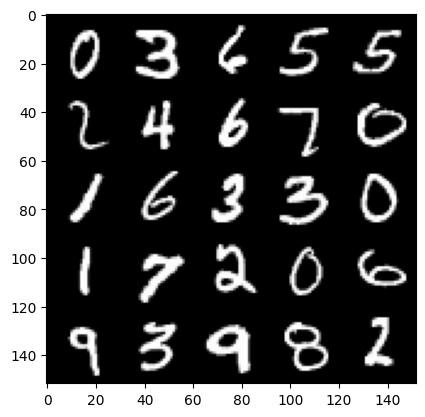

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 4.1054423294067375, discriminator loss: 0.08720894871652123


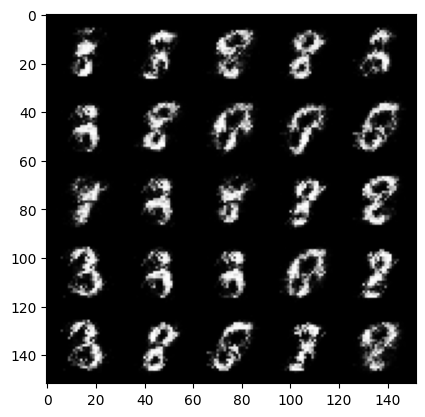

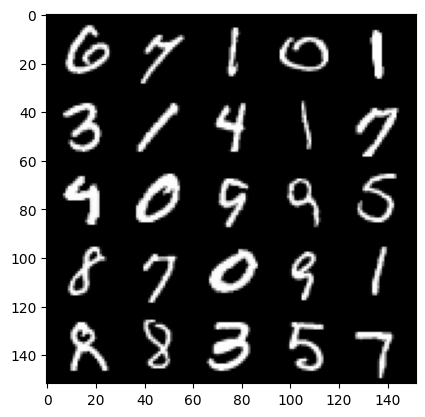

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 4.01565469551086, discriminator loss: 0.10879741101711982


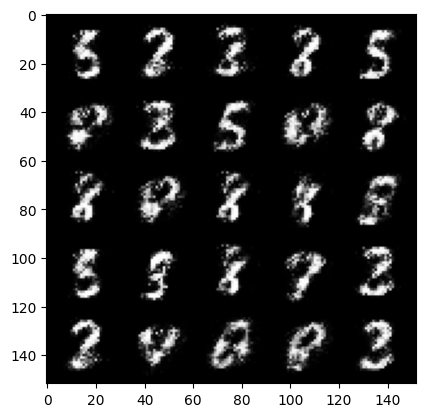

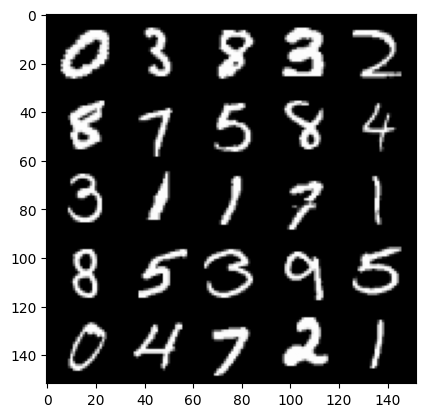

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 4.048664286613463, discriminator loss: 0.0818660861104727


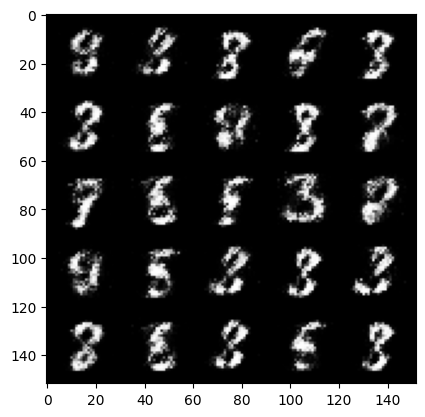

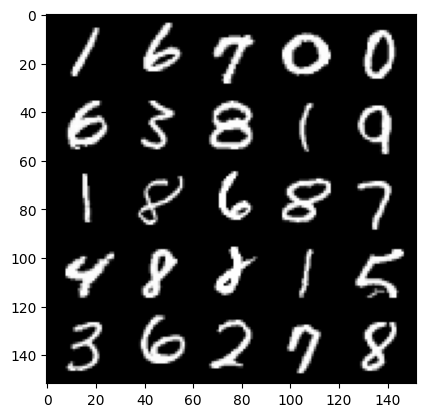

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.9062520451545706, discriminator loss: 0.09933163669705389


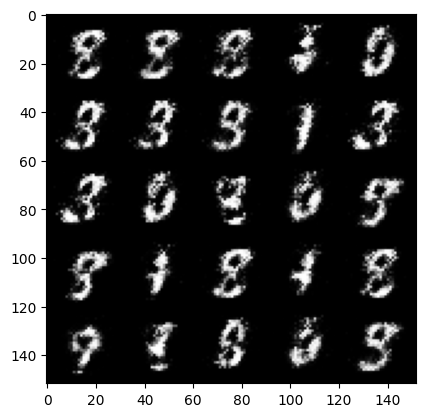

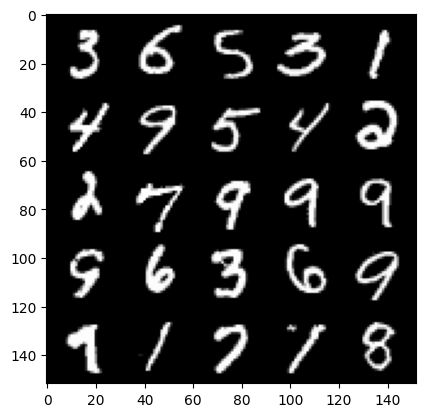

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.917369053840635, discriminator loss: 0.10110775397717958


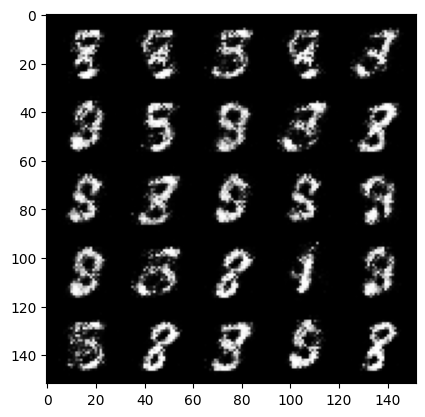

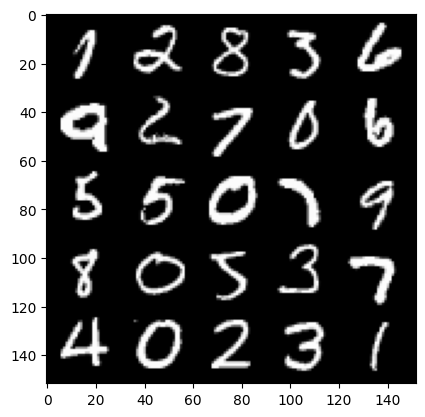

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 4.031192027568819, discriminator loss: 0.1080037943944335


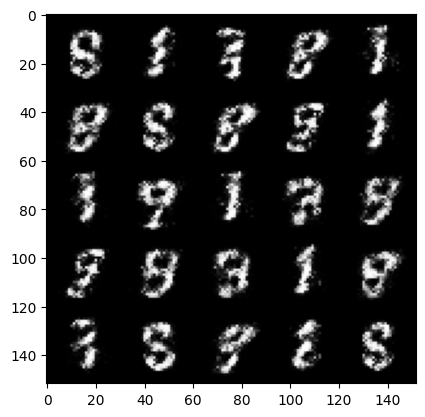

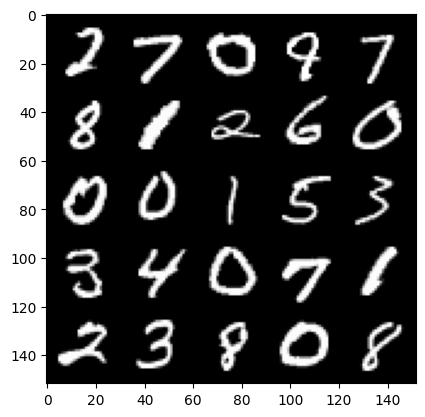

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.7473346548080437, discriminator loss: 0.13502215898782013


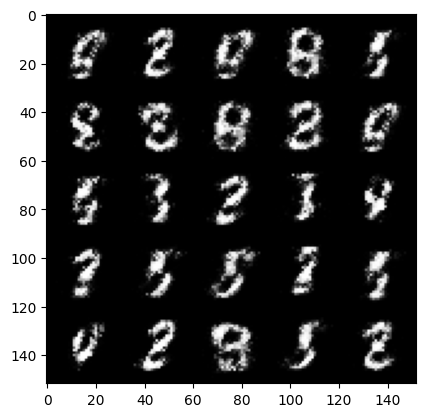

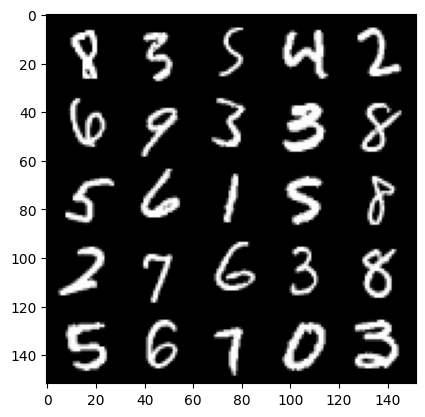

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.775348583698271, discriminator loss: 0.09554592311382291


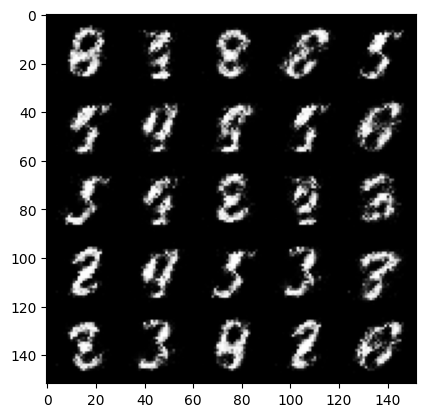

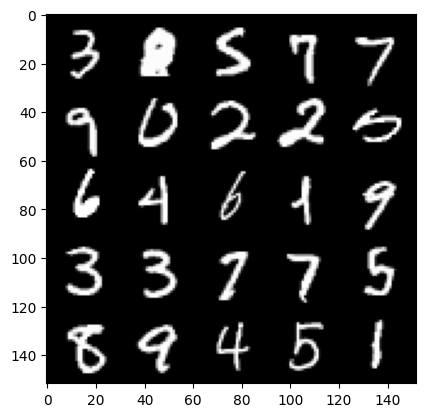

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.94566917419434, discriminator loss: 0.09781497637182468


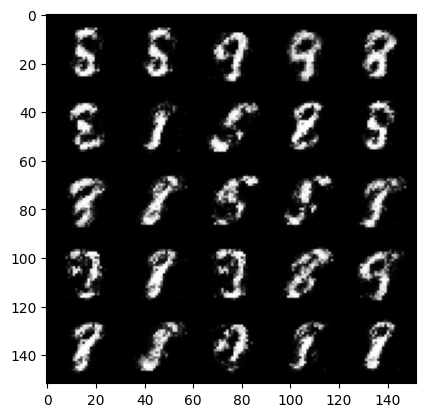

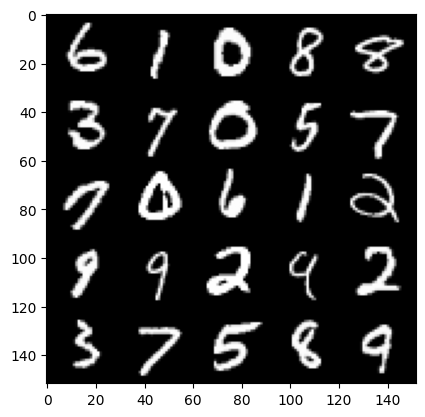

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.7056652441024776, discriminator loss: 0.11967343336343779


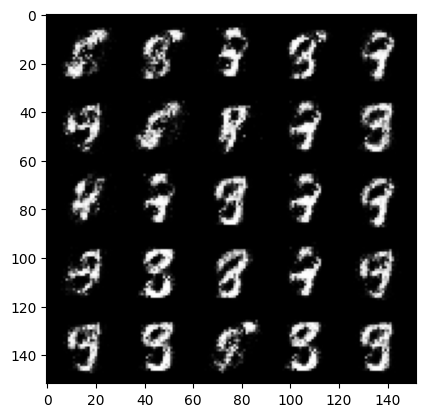

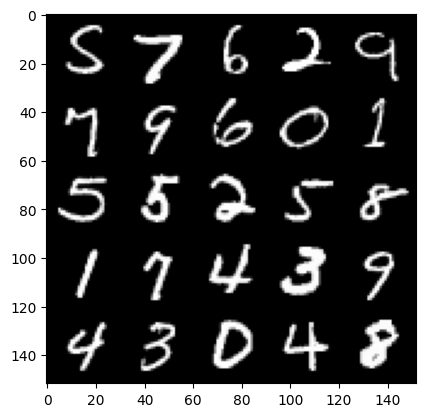

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.7117279176712015, discriminator loss: 0.11368788197636605


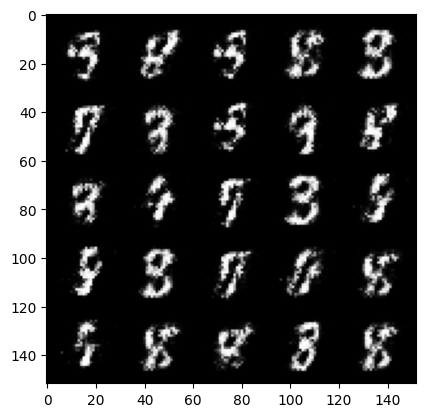

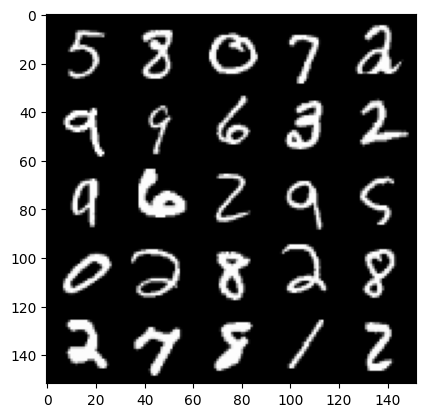

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.7103270301818814, discriminator loss: 0.11825290708988909


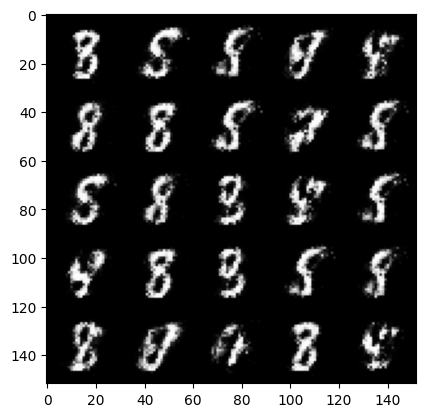

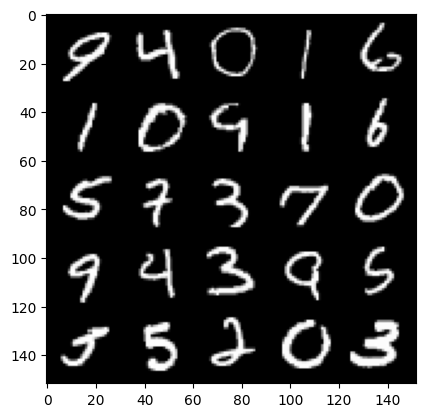

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.5564355082511927, discriminator loss: 0.1359406807124615


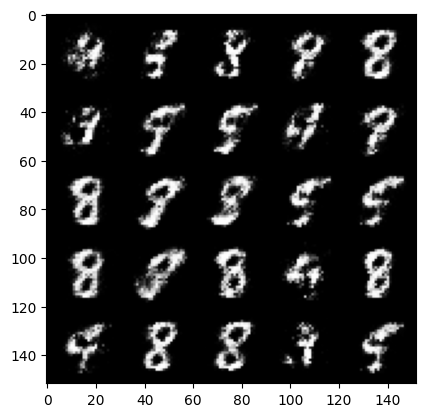

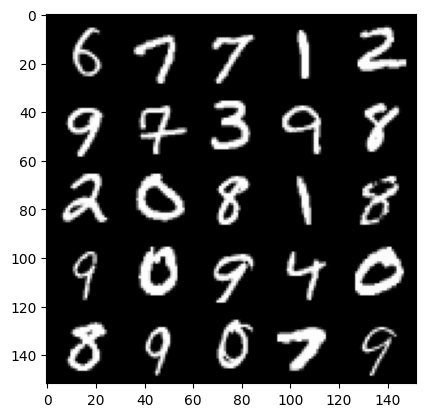

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.465544320583343, discriminator loss: 0.15294639557600012


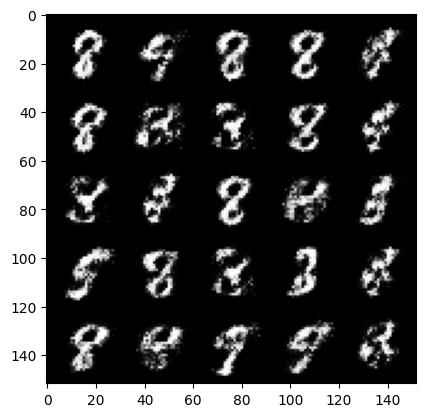

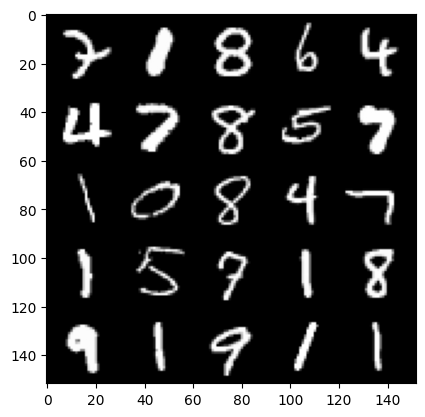

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.489350291728975, discriminator loss: 0.1346724604517222


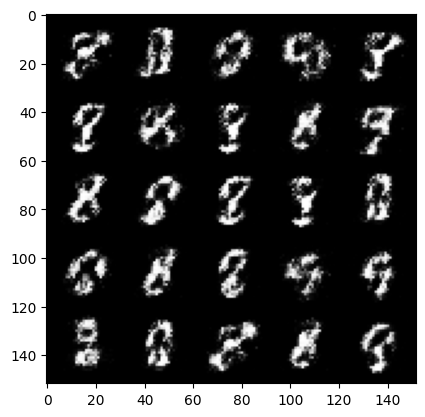

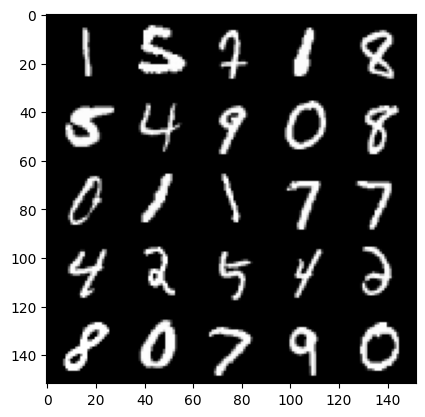

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.568009473800663, discriminator loss: 0.13106328748166557


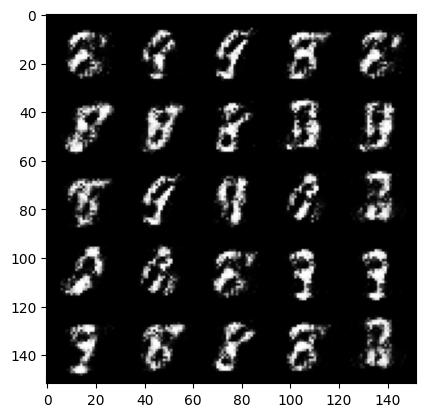

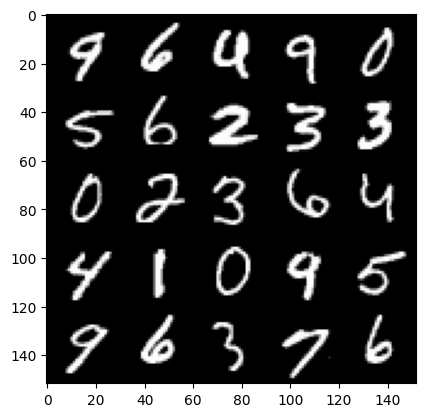

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.3681662735939035, discriminator loss: 0.16101308330893513


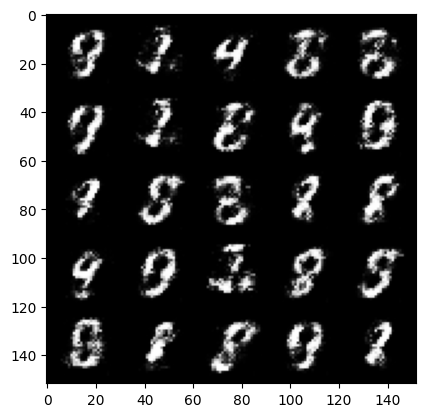

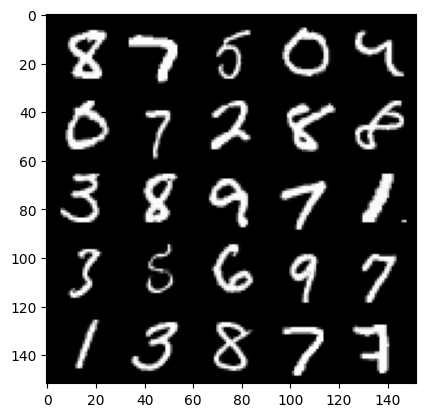

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.158746466159822, discriminator loss: 0.15611812735348946


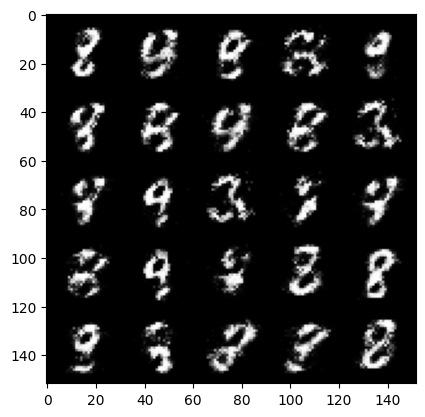

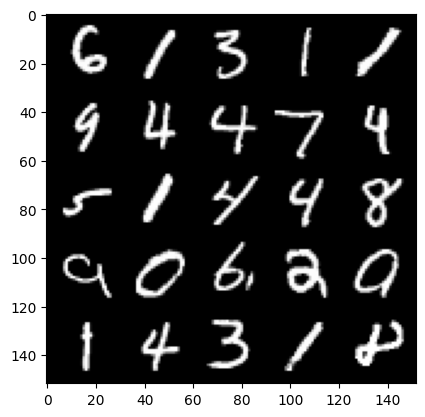

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.3309469661712625, discriminator loss: 0.1502973836362362


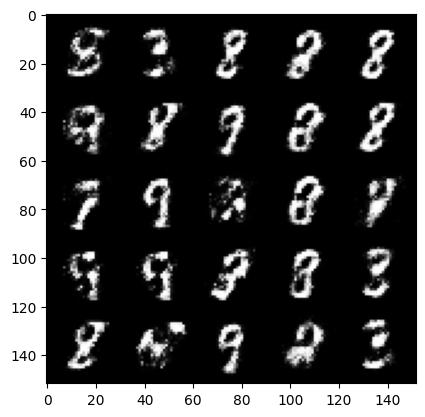

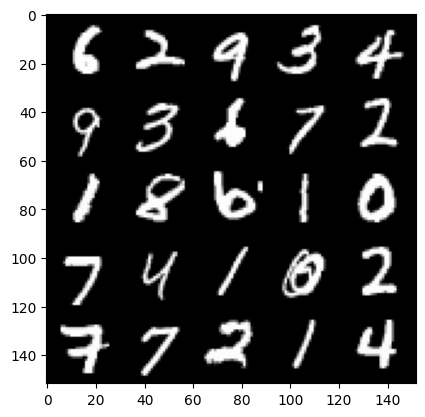

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 3.3910818195343033, discriminator loss: 0.1331365263164044


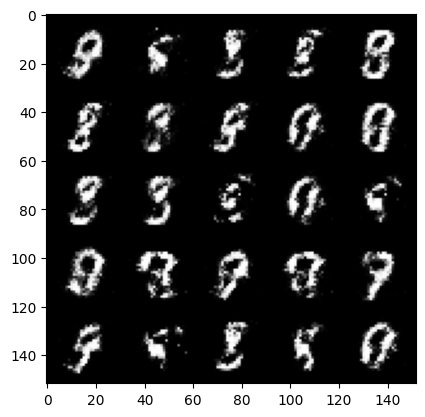

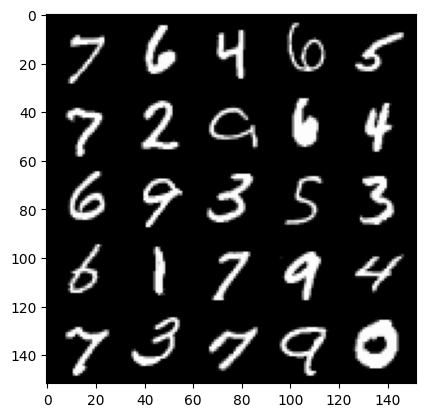

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 3.6796494750976536, discriminator loss: 0.12959027614444493


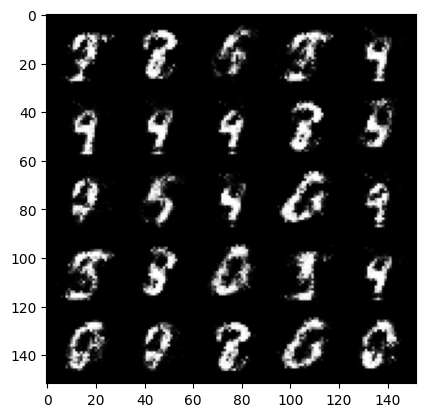

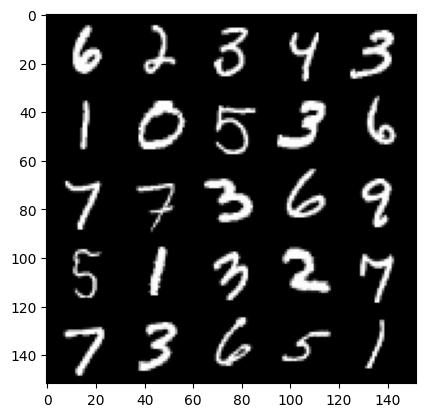

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 3.6002208199501036, discriminator loss: 0.11379295098781593


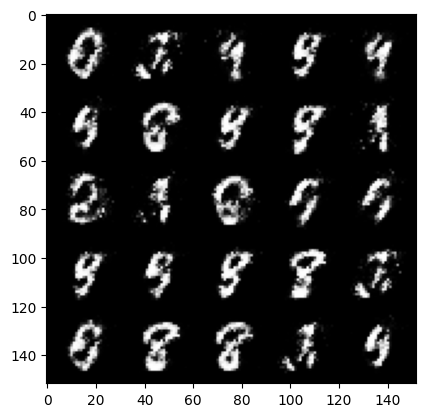

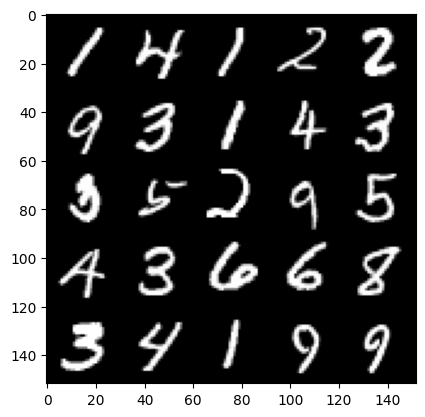

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 3.542489110946657, discriminator loss: 0.13163827949017282


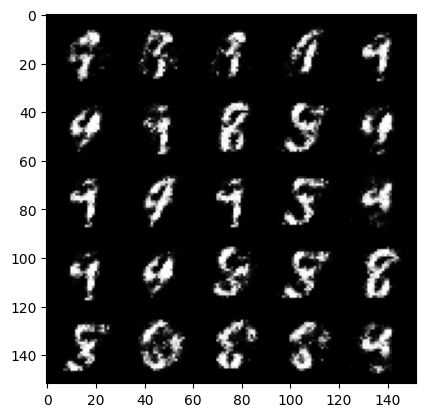

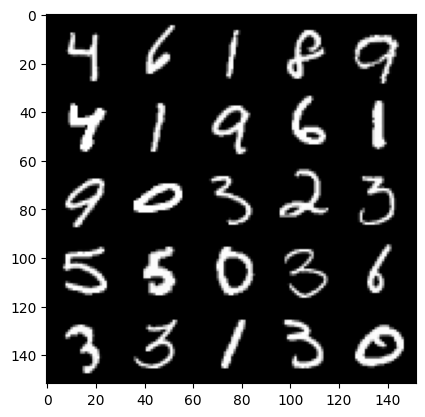

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 3.383972271919251, discriminator loss: 0.15337498301267627


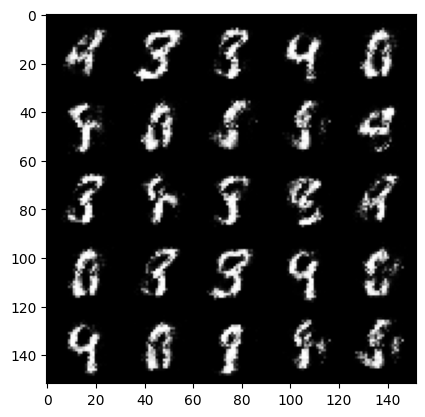

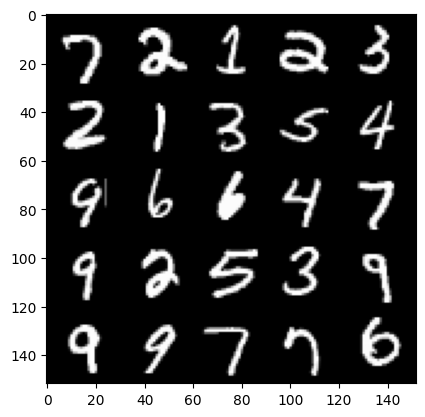

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 3.3138719973564115, discriminator loss: 0.16108784273266785


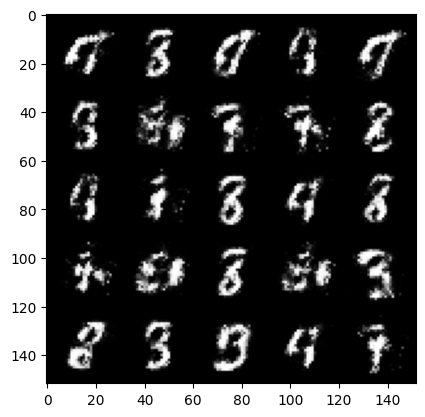

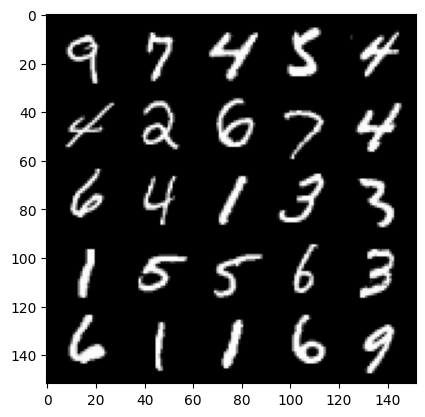

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 3.3161281318664573, discriminator loss: 0.15385793423652644


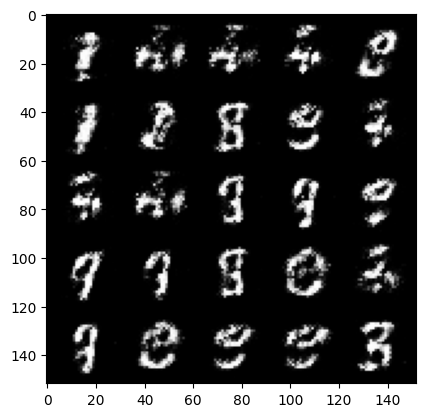

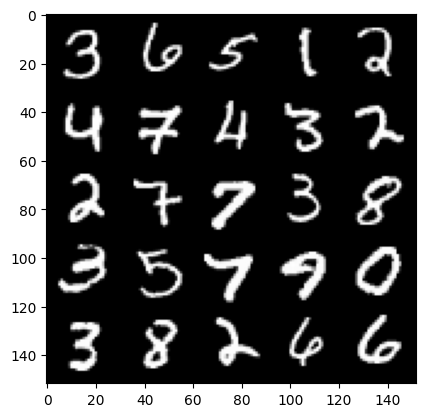

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 3.282368009567261, discriminator loss: 0.1590130029171705


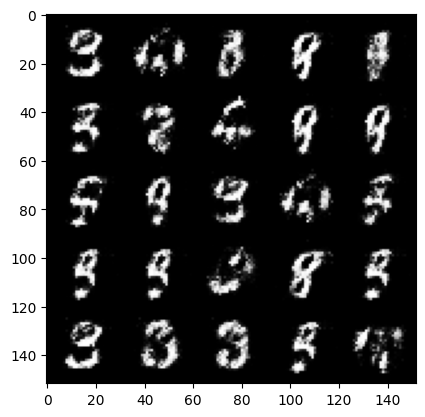

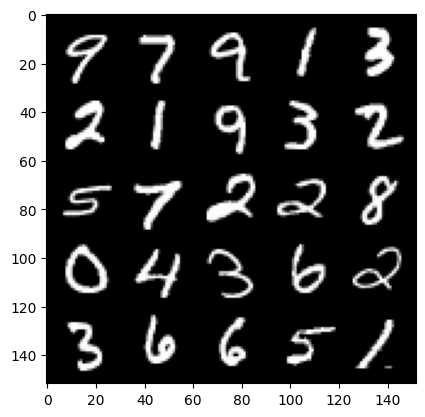

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 3.3146913394928, discriminator loss: 0.15284194868803022


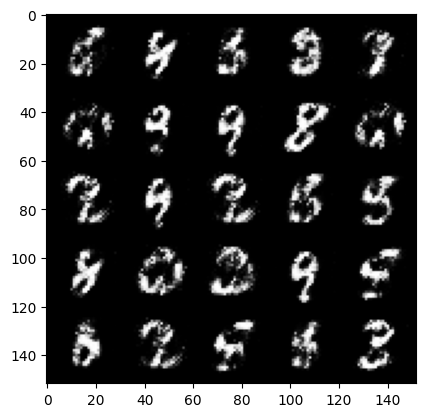

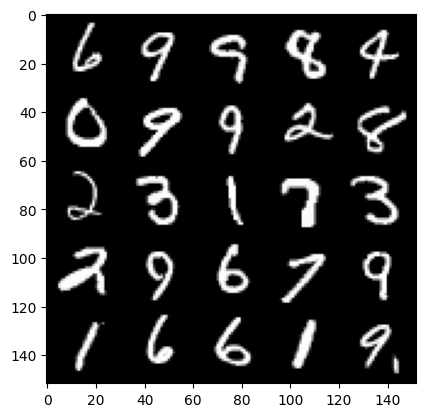

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 3.237098274707797, discriminator loss: 0.16060234676301463


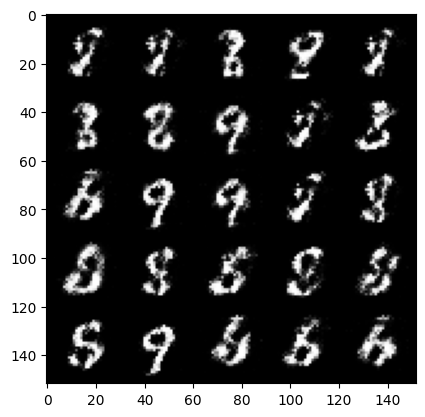

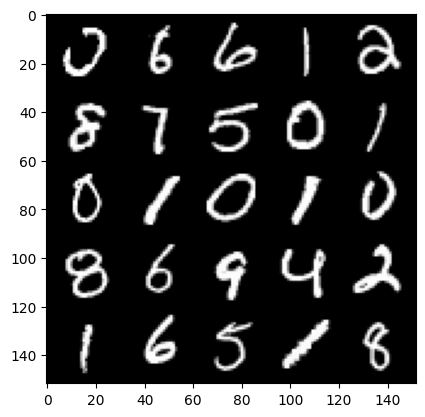

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 3.1356680479049666, discriminator loss: 0.17034765051305292


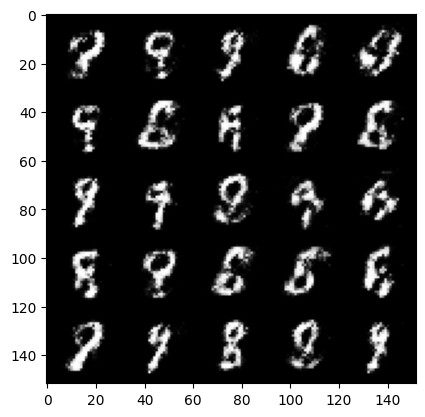

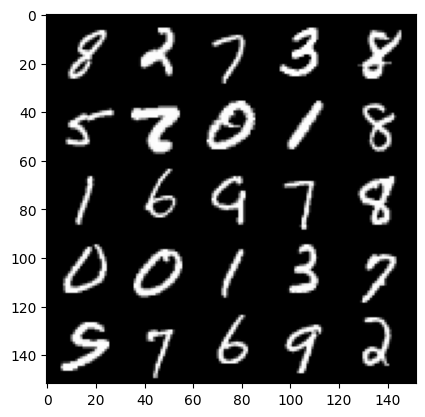

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 3.0064648785591115, discriminator loss: 0.171516421869397


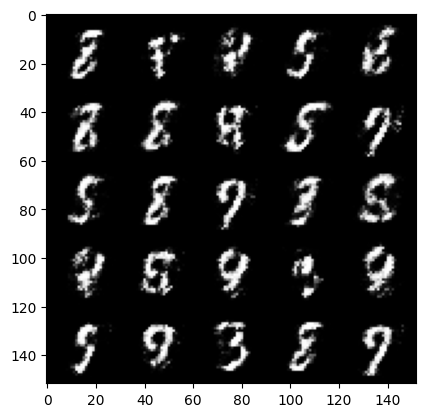

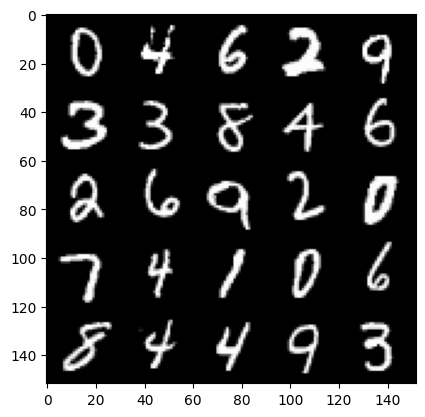

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 3.0348906688690165, discriminator loss: 0.17093591058254246


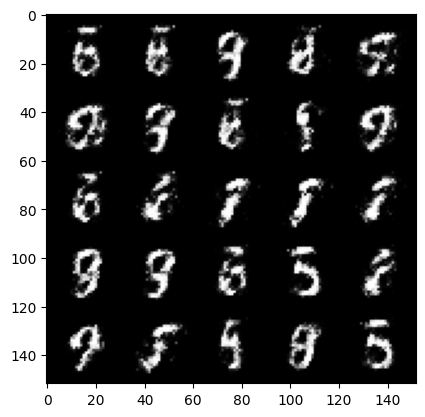

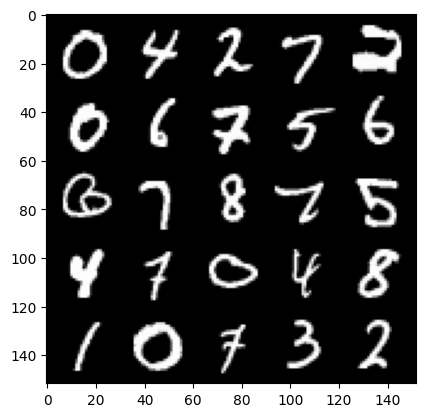

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 3.103053541183471, discriminator loss: 0.159029641725123


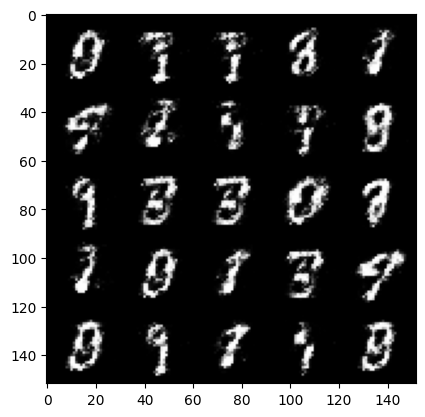

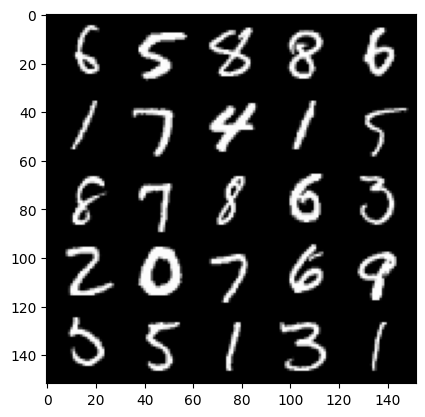

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 3.0598335871696483, discriminator loss: 0.17921553860604741


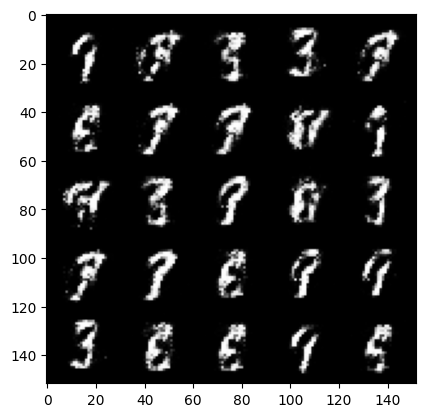

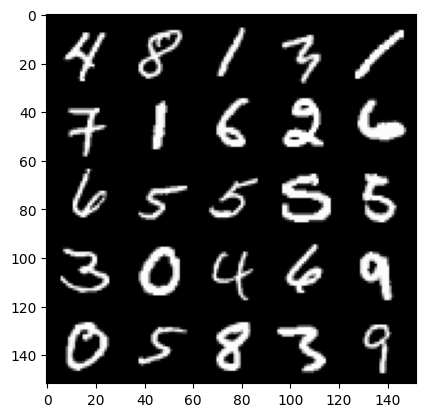

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 3.0891327457427997, discriminator loss: 0.17763188074529174


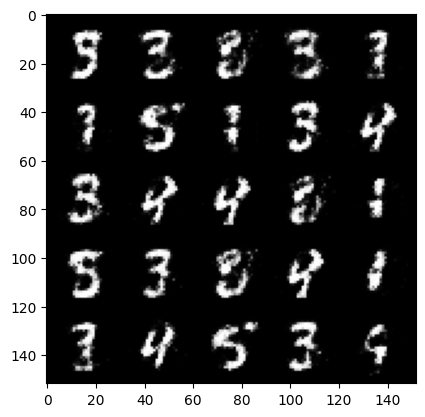

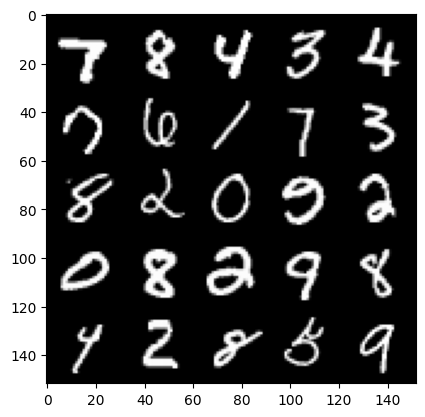

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.862675472736363, discriminator loss: 0.1901499341428281


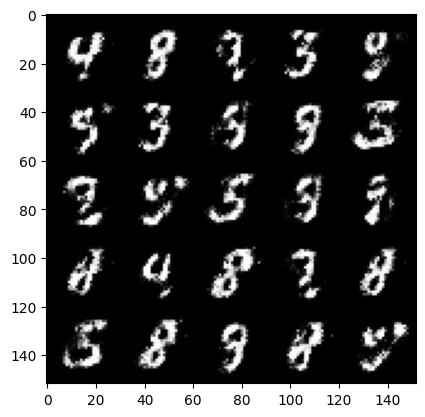

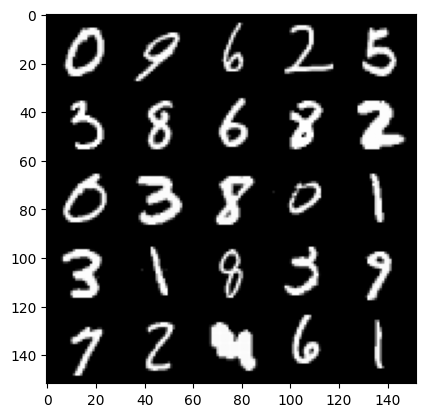

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.972055020809173, discriminator loss: 0.17719494128227237


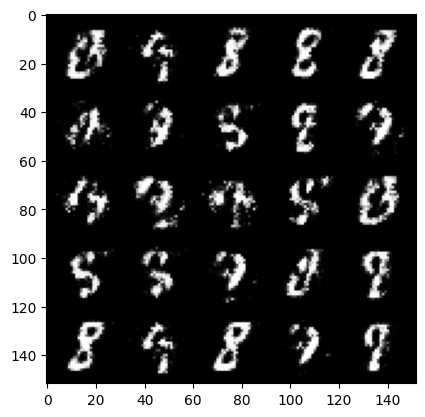

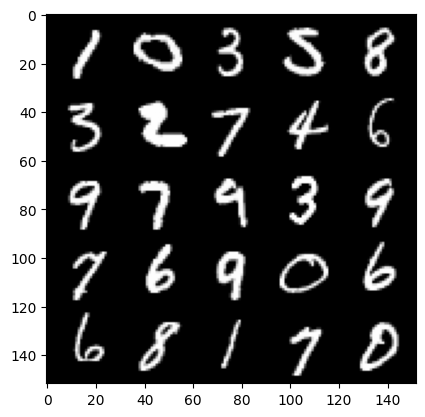

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 3.241257503032685, discriminator loss: 0.15548795308172714


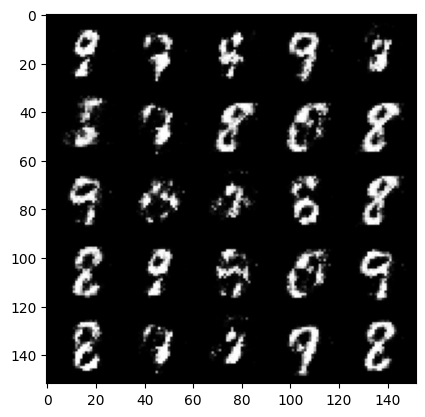

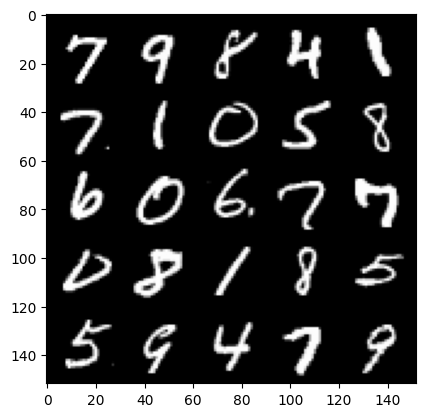

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 3.1321235184669454, discriminator loss: 0.1574831291735172


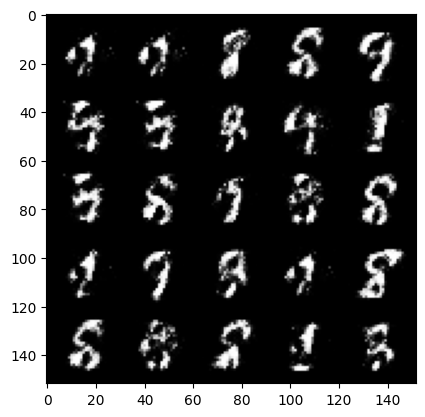

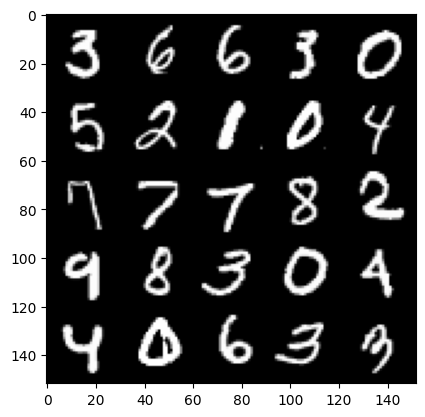

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.900187917709352, discriminator loss: 0.20583031247556177


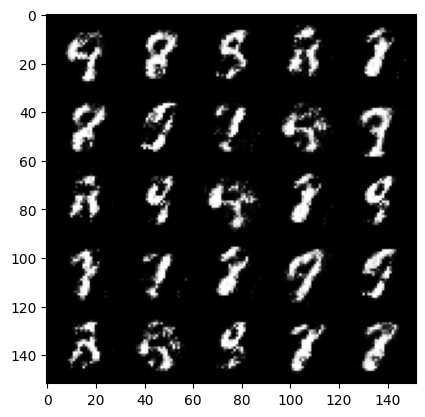

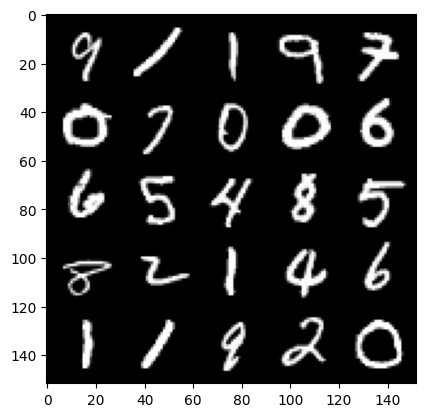

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 3.0362778987884527, discriminator loss: 0.18370530487596992


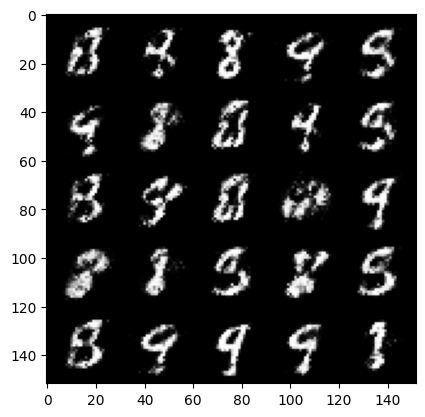

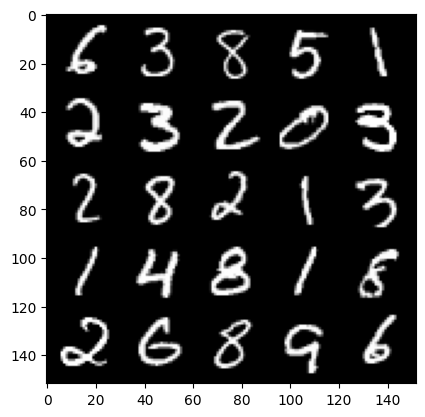

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.786653198719025, discriminator loss: 0.20510828810930248


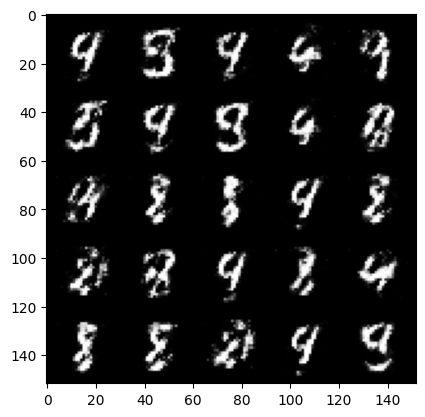

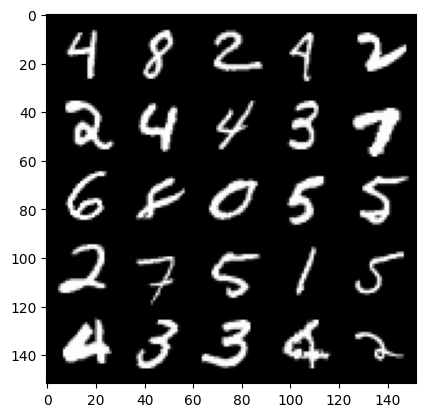

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.6882160334587124, discriminator loss: 0.22345079219341263


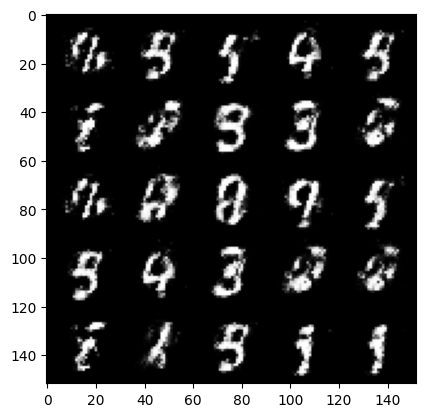

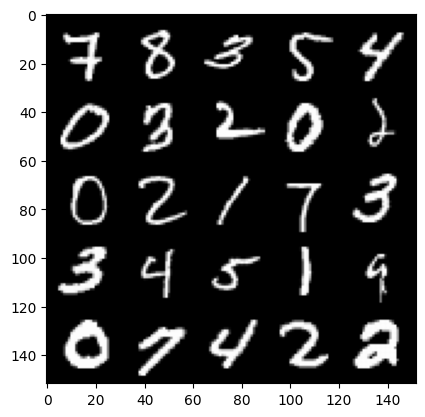

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.6394298210144065, discriminator loss: 0.2127491336315869


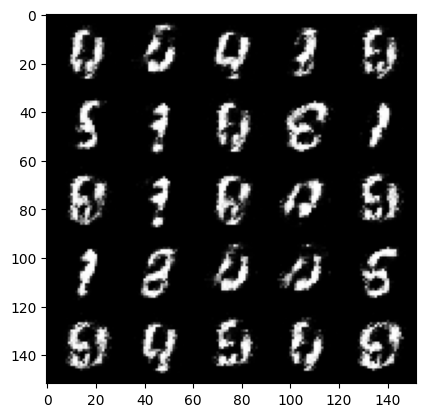

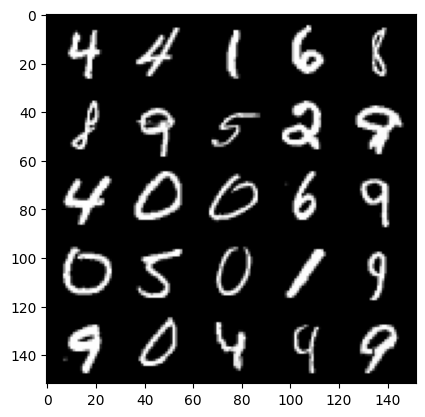

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.9186569485664355, discriminator loss: 0.18302370430529113


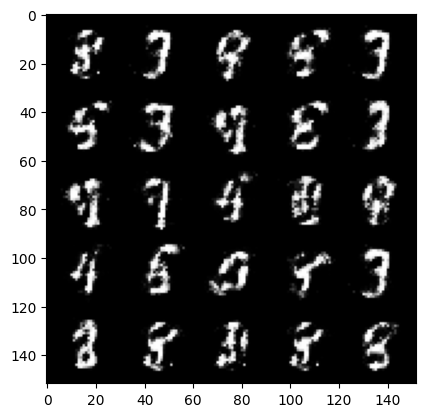

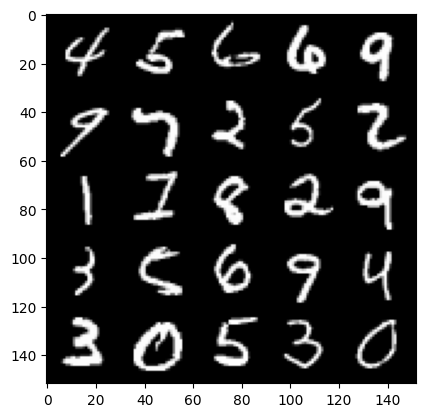

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.8644315943717973, discriminator loss: 0.1984785937517881


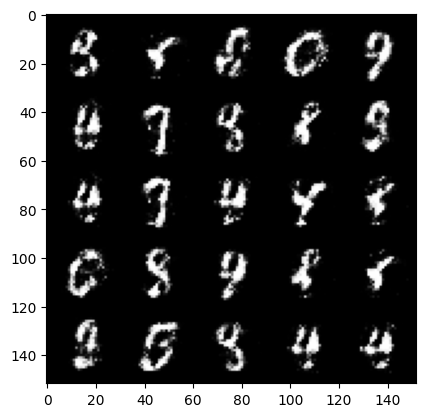

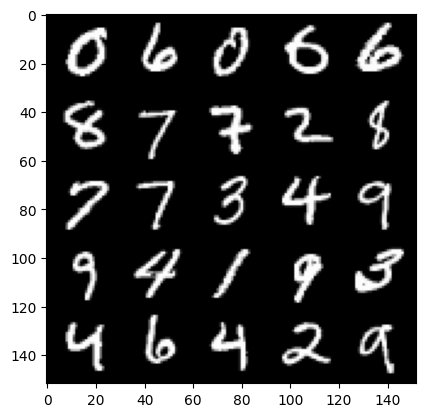

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.860656794071195, discriminator loss: 0.19642609253525728


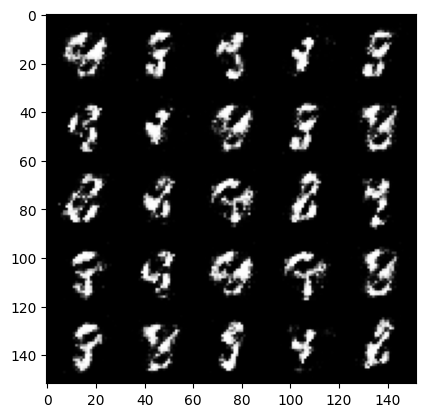

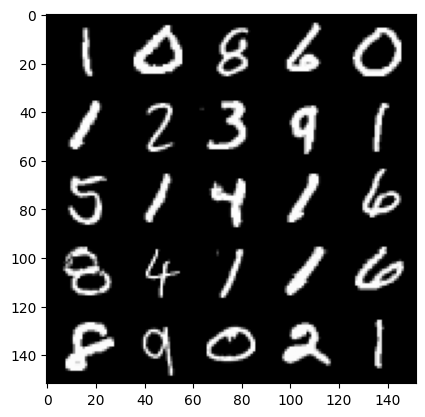

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.68746268892288, discriminator loss: 0.22467599353194234


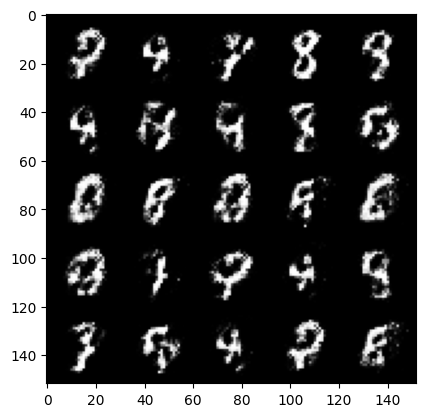

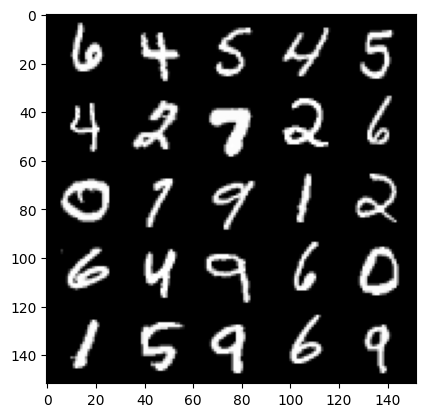

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.671044981956483, discriminator loss: 0.20937971782684342


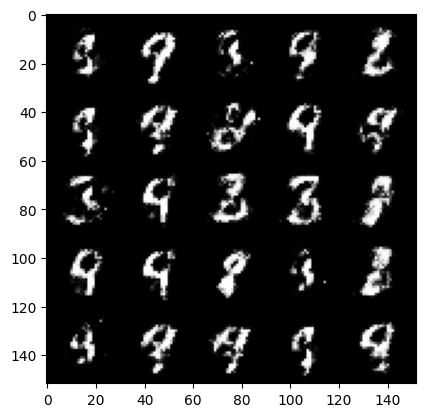

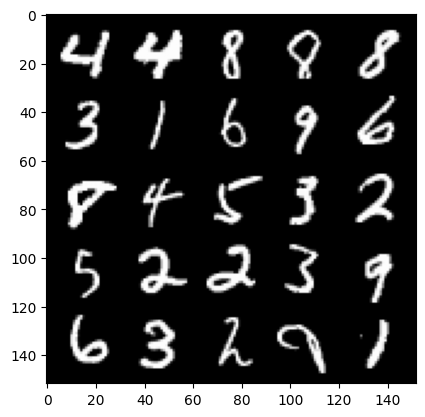

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.722283505439757, discriminator loss: 0.20184383784234514


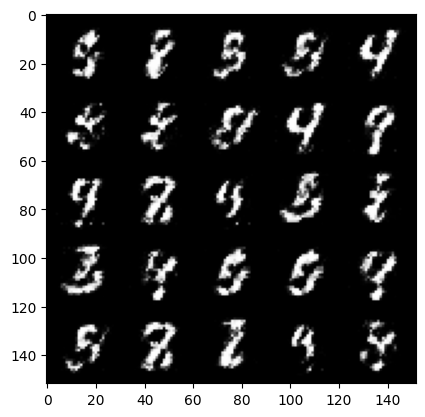

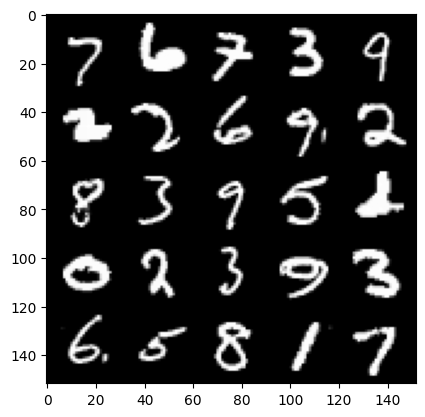

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.8827806987762408, discriminator loss: 0.19821664200723163


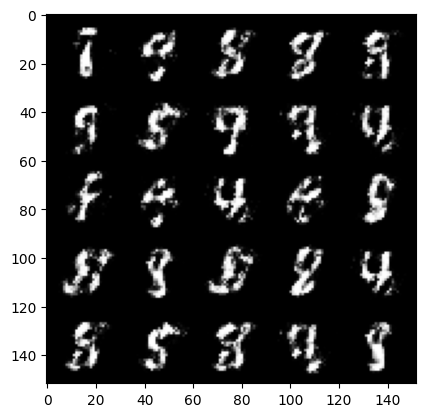

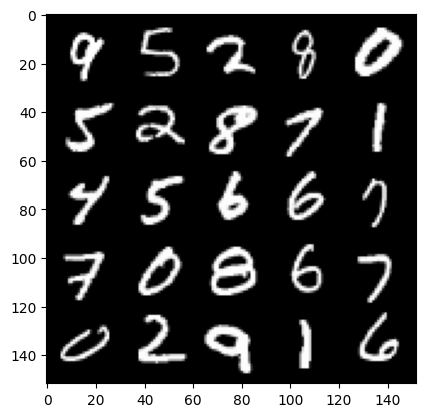

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.654680113315582, discriminator loss: 0.24151326318085206


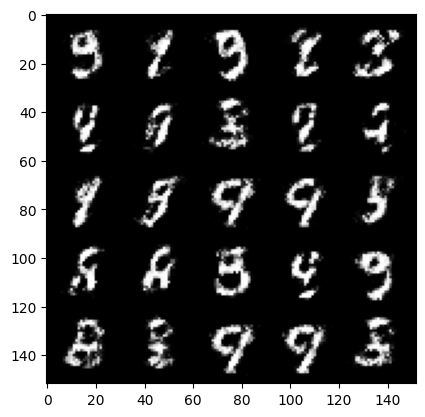

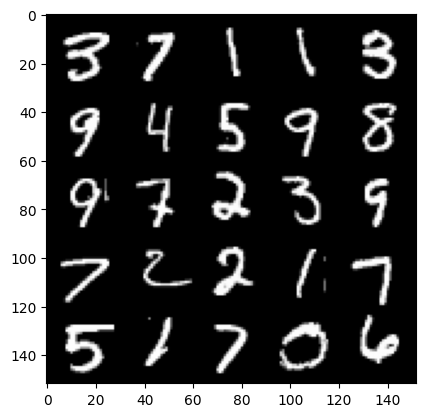

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.5711738591194138, discriminator loss: 0.22218629866838444


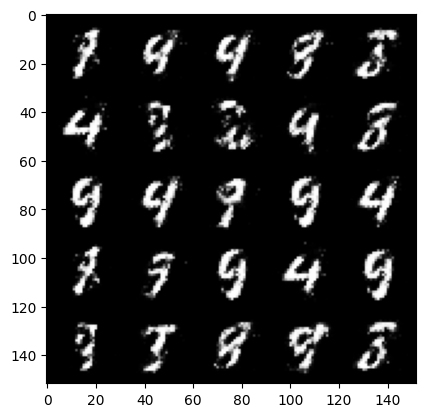

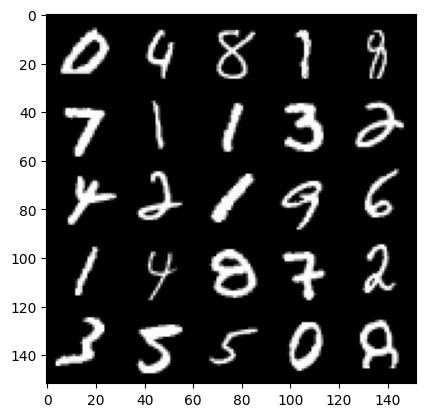

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.629904727935788, discriminator loss: 0.23376487046480188


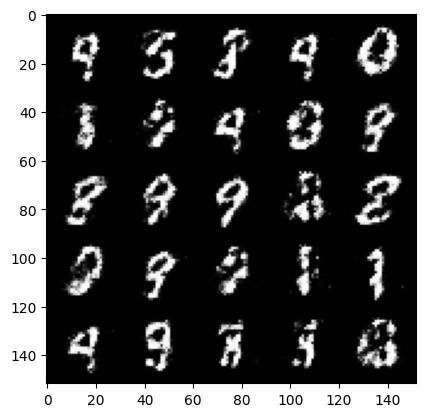

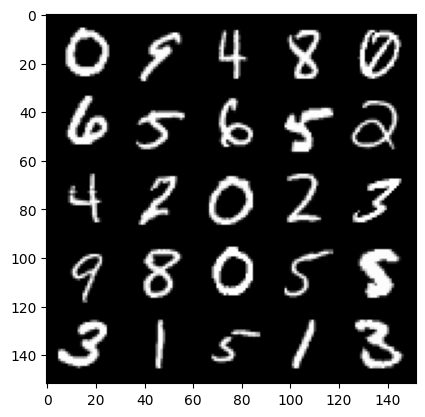

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.610520737171172, discriminator loss: 0.21211977890133857


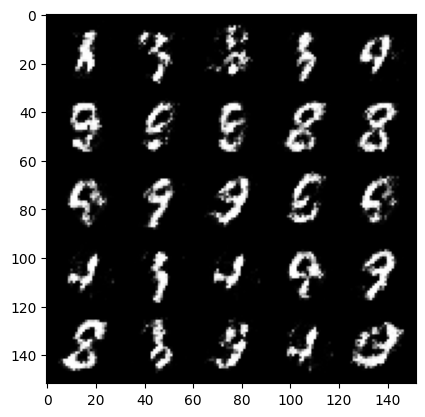

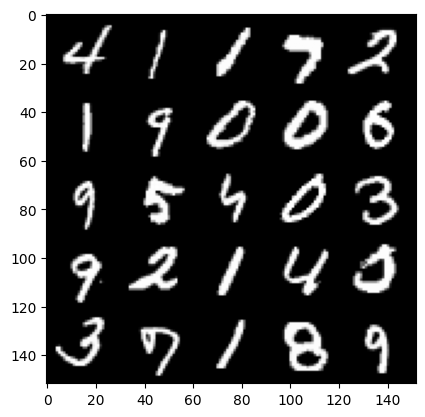

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.761161329269412, discriminator loss: 0.22402998186647896


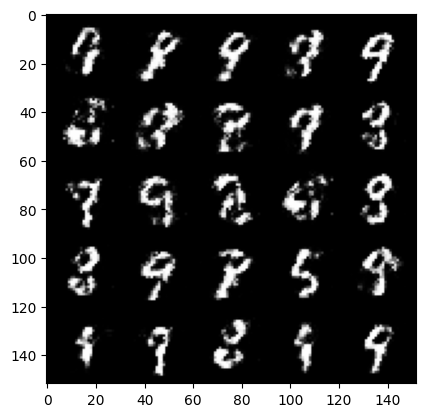

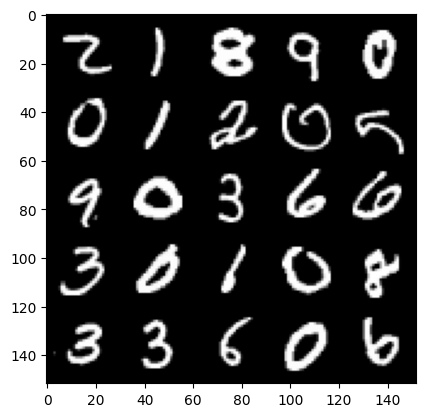

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.497191169738765, discriminator loss: 0.22774152977764603


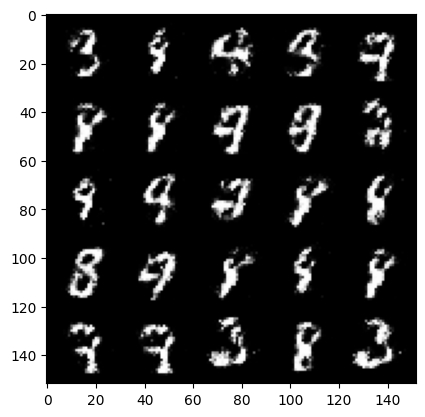

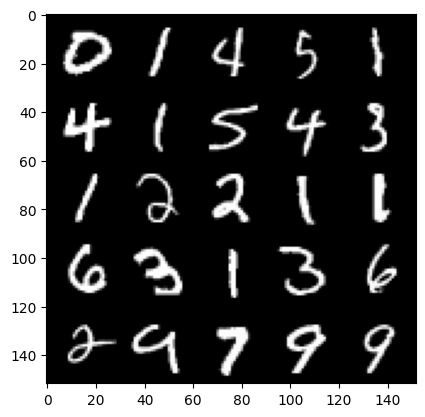

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.622906124114993, discriminator loss: 0.21682578164339064


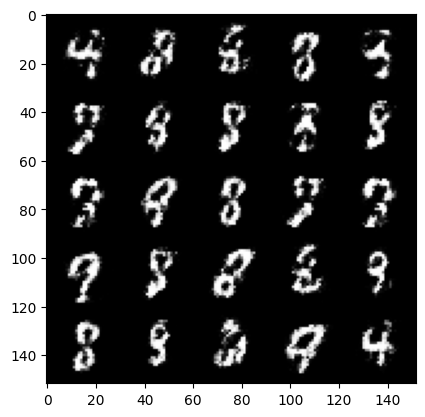

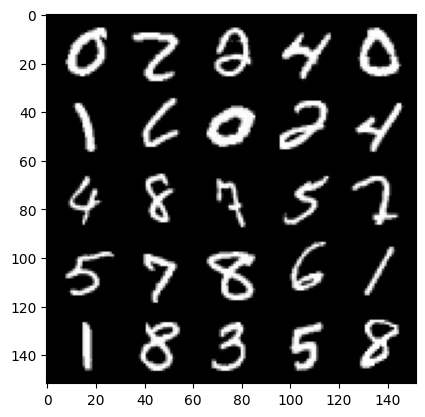

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.71765689945221, discriminator loss: 0.2059791224002838


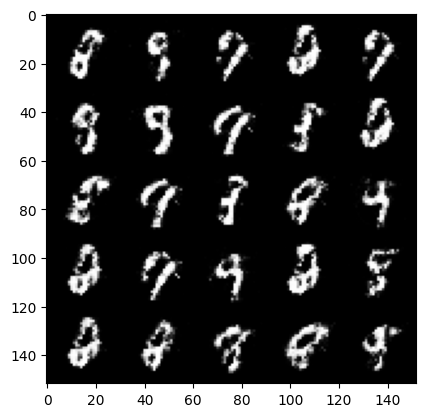

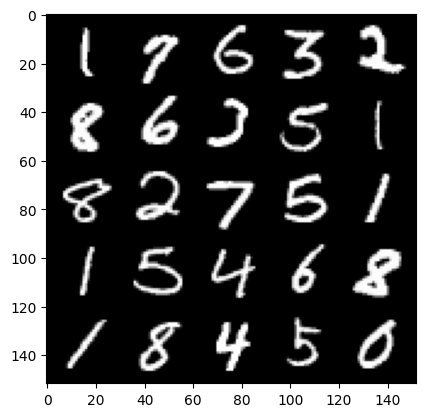

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.705198012828826, discriminator loss: 0.20407635577023012


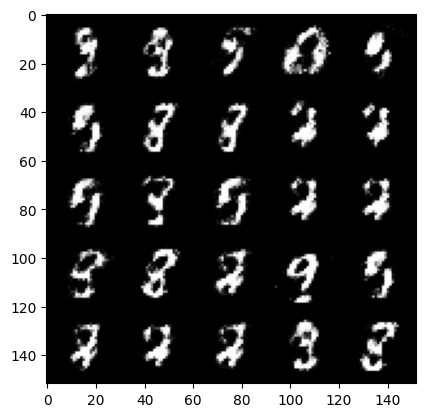

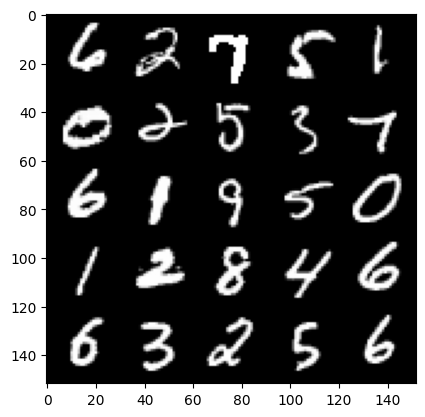

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.8130689330101015, discriminator loss: 0.1915967440307142


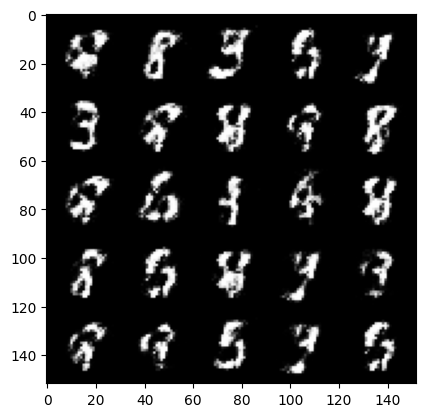

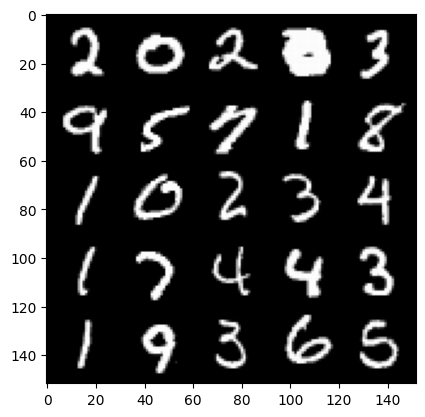

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 2.529604246854781, discriminator loss: 0.24383301423490056


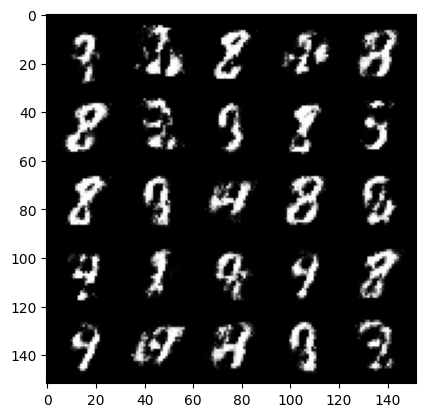

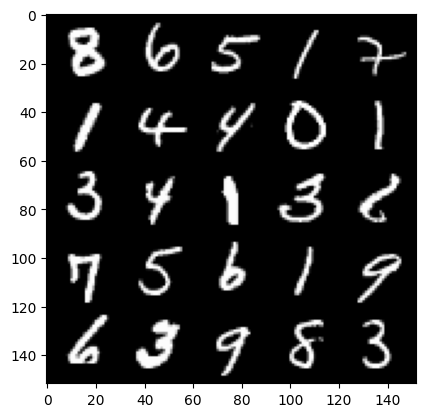

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 2.479738914966586, discriminator loss: 0.24207504987716677


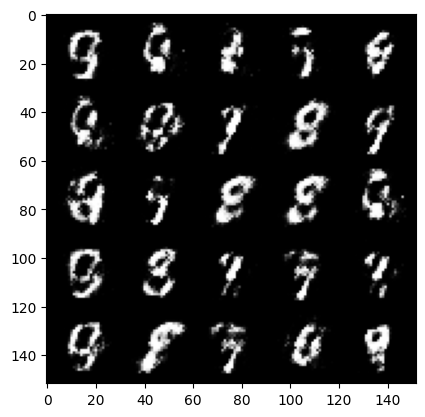

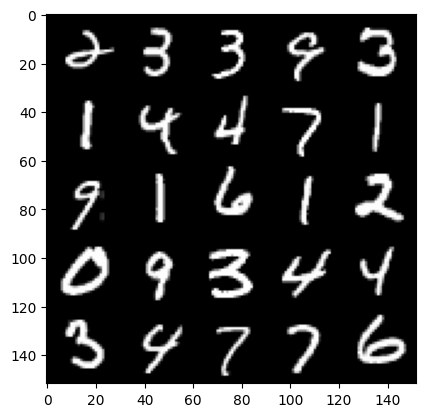

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 2.5192601788044, discriminator loss: 0.24251379615068436


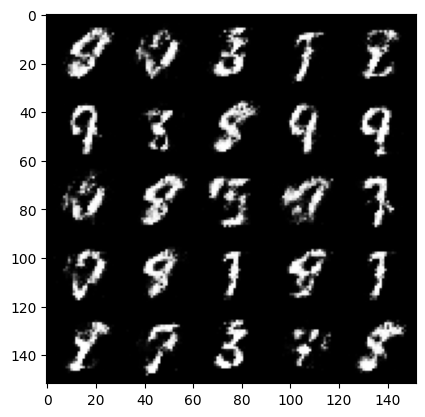

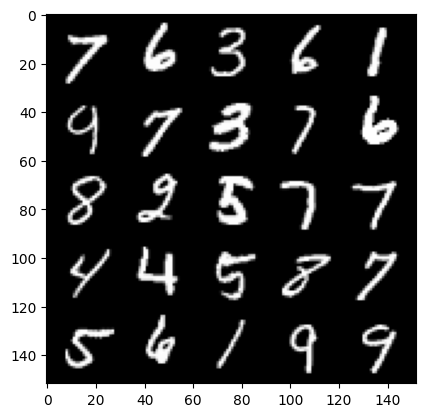

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 2.3681083242893233, discriminator loss: 0.24363822656869893


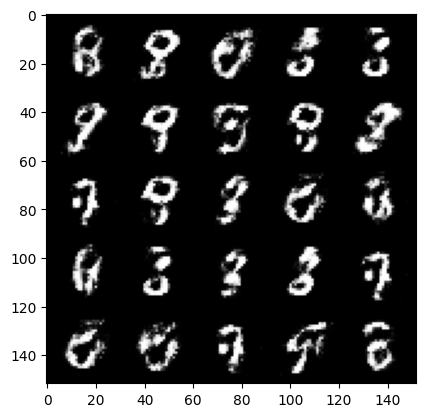

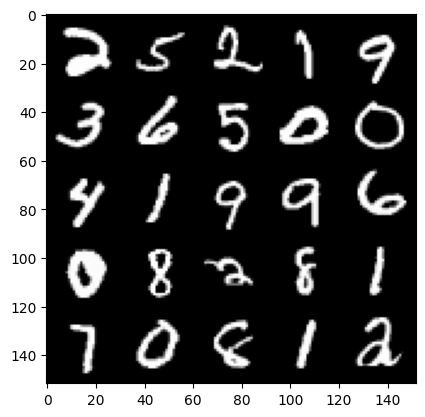

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 2.4099897637367262, discriminator loss: 0.2574336996674536


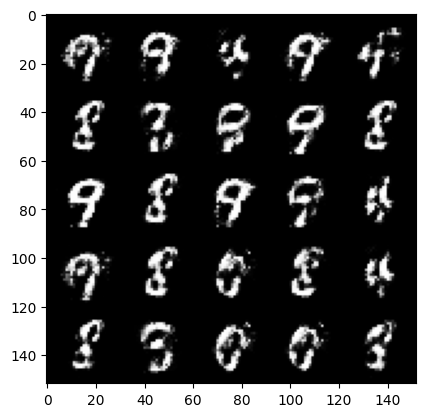

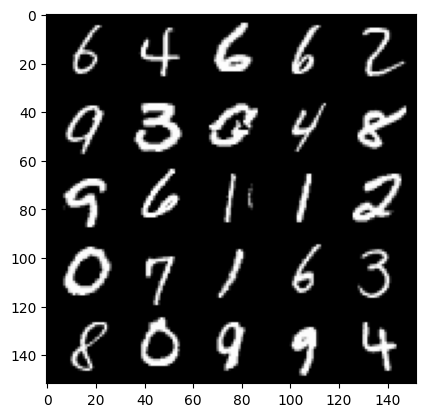

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 2.471496624469763, discriminator loss: 0.2392986502349378


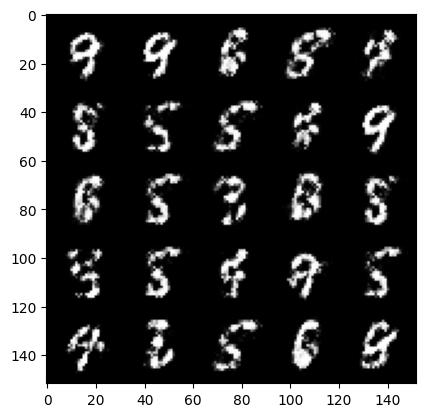

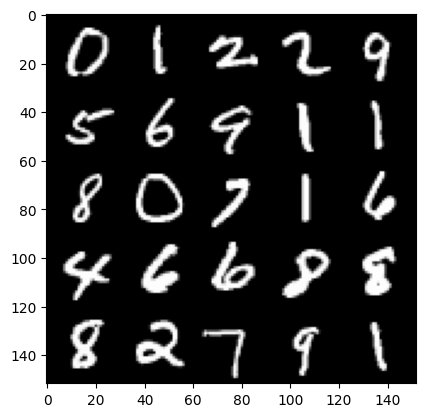

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 2.2809700384140017, discriminator loss: 0.2722536644935606


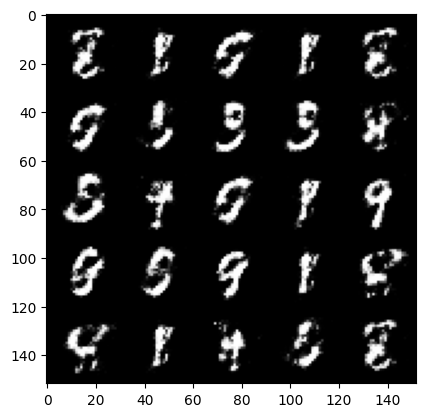

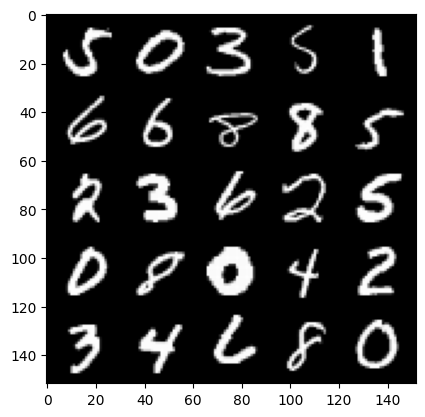

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 2.2972874329090125, discriminator loss: 0.2707217165827751


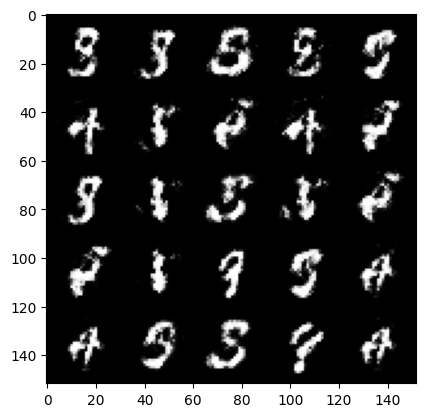

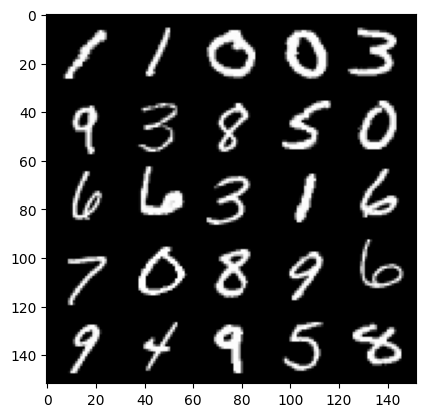

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 2.2497635953426367, discriminator loss: 0.2804674805104733


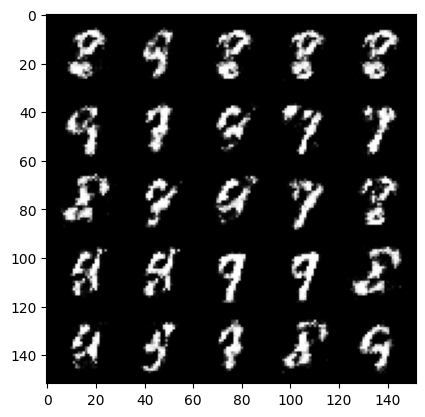

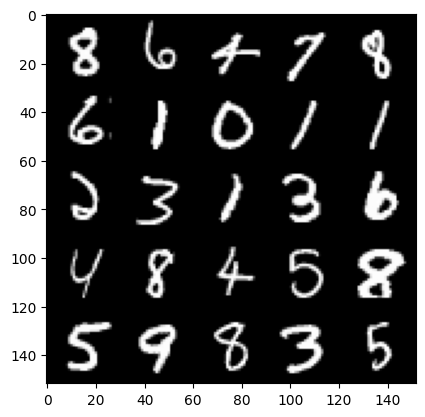

In [ ]:


cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
